# RDD: Find discontinuities caused by a global event

## 1. Basics 

Import libraries

In [16]:
%matplotlib inline

from datetime import datetime, timedelta
import scipy.stats
import codecs                     # load UTF-8 Content
import json                       # load JSON files
import pandas as pd               # Pandas handles dataframes
import numpy as np                # Numpy handles lots of basic maths operations
import matplotlib.pyplot as plt   # Matplotlib for plotting
import seaborn as sns             # Seaborn for beautiful plots
from dateutil import *            # I prefer dateutil for parsing dates
import math                       # transformations
import statsmodels.formula.api as smf  # for doing statistical regression
import statsmodels.api as sm      # access to the wider statsmodels library, including R datasets
from collections import Counter   # Counter is useful for grouping and counting
import scipy
from patsy import dmatrices
import statsmodels.formula.api as sm

Set global variables

In [17]:
N=7                          # the period, in days, before and after the event we are interested in
COUNTRY_OF_INTEREST = 'US'     # for which country we want to do the data analysis


Set global functions

In [14]:
def read_events(a_file):
    events = pd.read_csv(a_file, sep=",", names=['id', 'description', 'year', 'month', 'day', 'category'])
    return events

## 2. Load event data

We load the events in a Pandas dataframe and create a new column that contains the date in one cell. The date is converted to datetime in order to make future processing easier. As we only have music data up till 2015, we filter out all the events after 01/01/2015.


---------------------------------------------------------

Preview of the dataset

    id        description  year  month  day category       date
60  60           iPhone 6  2014      9    9     tech 2014-09-09
61  61  Samsung Galaxy S5  2014      2   25     tech 2014-02-25
62  62            Nexus 6  2014     10   16     tech 2014-10-16
63  63             Moto G  2014     11   28     tech 2014-11-28
64  64     Samsung Note 4  2014      8   31     tech 2014-08-31

---------------------------------------------------------

Total number of events: 168

---------------------------------------------------------

Visual overview of events



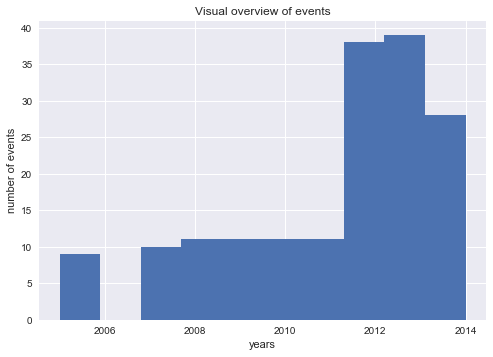

In [15]:
events = read_events("../data/events.csv")

# The dataset has the year, month, and day in three different cells. We would like to have this information in one cell
dates = []
for index, row in events.iterrows():
    date = str(events.iloc[index]['year']) + "-" + str(events.iloc[index]['month']) + "-" + str(events.iloc[index]['day'])
    dates.append(date)

# CREATE A NEW DATA FRAME AND MERGE WITH EVENT DATA FRAME
df2 = pd.DataFrame(dates, columns=['date'])
events = pd.concat([events, df2], axis=1)
events['date'] = pd.to_datetime(events['date'], format='%Y-%m-%d')

# Drop duplicates
events.drop_duplicates(subset=['description', 'date'], keep='first', inplace=True)

# APPLY FILTER TO EVENT DATA FRAME
events_filtered = events[(events['year'] < 2015)]

print('')
print('---------------------------------------------------------')
print('')

print('Preview of the dataset')
print('')

print(events_filtered.head())

print('')
print('---------------------------------------------------------')
print('')

print('Total number of events: %s' % len(list(events_filtered.description)))

print('')
print('---------------------------------------------------------')
print('')

print('Visual overview of events')
print('')

plt.hist(list(events_filtered.year))

plt.title('Visual overview of events')
plt.xlabel('years')
plt.ylabel('number of events')

## 3. Load the Listening data

We load a dataframe that contains the absolute and relative playcount per genre for each country on a daily basis. From the t-test, we know that the seasonal component might cause the number of listening events going up or down after an event, but have no relation with the event itself. Therefore, we load a dataframe that also has a column that subtracts the seasonal component from the original signal.

In [5]:
df = pd.DataFrame(json.load(open("../data/TSA_one_genre_components.json")))
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')
df['original'] = df['original'].astype('float64')
df['trend'] = df['trend'].astype('float64')
df['seasonal'] = df['seasonal'].astype('float64')
df['residual'] = df['residual'].astype('float64')

# CREATE DATA WITHOUT SEASONAL COMPONENT
df['no_seas'] = df['original'] - df['seasonal']

# FILTER COUNTRIES
df_filter = df[(df.country == COUNTRY_OF_INTEREST)]

def get_year(year):
    return year.year

df_filter['year'] = df_filter['date'].map(get_year)
df_filter.set_index('date', inplace=True)
print(df_filter.head())

           country            genre  original  residual   seasonal  trend  \
date                                                                        
2005-01-01      US  total_playcount     856.0       NaN -34.666493    NaN   
2005-02-14      US  total_playcount     508.0       NaN  37.839847    NaN   
2005-02-15      US  total_playcount     634.0       NaN -19.994159    NaN   
2005-02-16      US  total_playcount     635.0       NaN -88.823265    NaN   
2005-02-17      US  total_playcount     637.0       NaN -11.010729    NaN   

               no_seas  year  
date                          
2005-01-01  890.666493  2005  
2005-02-14  470.160153  2005  
2005-02-15  653.994159  2005  
2005-02-16  723.823265  2005  
2005-02-17  648.010729  2005  


/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


Furthermore, we load a dataframe that contains the number of unqique listeners per day. This number follows from the listen event file and is used to calculate the number of songs listened per user.

In [6]:
unqiue_listeners_per_day = pd.DataFrame(json.load(open("../data/unique_users_per_day.json")))
unqiue_listeners_per_day['date'] = pd.to_datetime(unqiue_listeners_per_day['date'], format='%Y-%m-%d')
unqiue_listeners_per_day.set_index('date', inplace=True)
unqiue_listeners_per_day.sort_index(inplace=True)

print('')
print('---------------------------------------------------------')
print('')

print('Preview of the dataset')
print('')
print(unqiue_listeners_per_day.head())

print('')
print('---------------------------------------------------------')
print('')

print('Number of days for which we have unique listeners: %s' % len(list(unqiue_listeners_per_day['number_of_unqiue_listeners'])))

print('')
print('---------------------------------------------------------')
print('')




---------------------------------------------------------

Preview of the dataset

            number_of_unqiue_listeners
date                                  
1970-01-01                           2
2005-02-14                          73
2005-02-15                          77
2005-02-16                          75
2005-02-17                          68

---------------------------------------------------------

Number of days for which we have unique listeners: 3493

---------------------------------------------------------



We concatinate both the event and unqiue user dataframe, and add a new column that devides the playcount through the number of unqiue users. We do this eliminate an effect possible caused by the number of users that listen.

In [19]:
DF = pd.concat([df_filter, unqiue_listeners_per_day], axis=1, join='inner')
DF['rel_play'] = DF['no_seas'] / DF['number_of_unqiue_listeners']
DF['rel_trend'] = DF['trend'] / DF['number_of_unqiue_listeners']
print(DF.head())


           country            genre  original  residual   seasonal  trend  \
date                                                                        
2005-02-14      US  total_playcount     508.0       NaN  37.839847    NaN   
2005-02-15      US  total_playcount     634.0       NaN -19.994159    NaN   
2005-02-16      US  total_playcount     635.0       NaN -88.823265    NaN   
2005-02-17      US  total_playcount     637.0       NaN -11.010729    NaN   
2005-02-18      US  total_playcount     435.0 -3.557515 -96.242485  534.8   

               no_seas  year  number_of_unqiue_listeners  rel_play  rel_trend  
date                                                                           
2005-02-14  470.160153  2005                          73  6.440550        NaN  
2005-02-15  653.994159  2005                          77  8.493431        NaN  
2005-02-16  723.823265  2005                          75  9.650977        NaN  
2005-02-17  648.010729  2005                          68  9.

From the t-test, we saw that changes between the the data group before and after the event where often caused by a higher level trend. However, even in this trend the event might have an impact which should result in a discontinuity of the regression at the day of the event.

The Forcing Variable (csize) is centered around the cutoff, and the cutoff predictor (small) is a dichotomous variable that indicates which side of the cutoff an observation lands.

/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu


---------------------------------------------------------

R-squared: 0.381633637477

---------------------------------------------------------

Parameters

Intercept                  8.968675
threshold                  4.277744
days_to_event             -0.328594
threshold:days_to_event   -0.166648
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000090
threshold                  0.041493
days_to_event              0.326559
threshold:days_to_event    0.719136
dtype: float64

---------------------------------------------------------



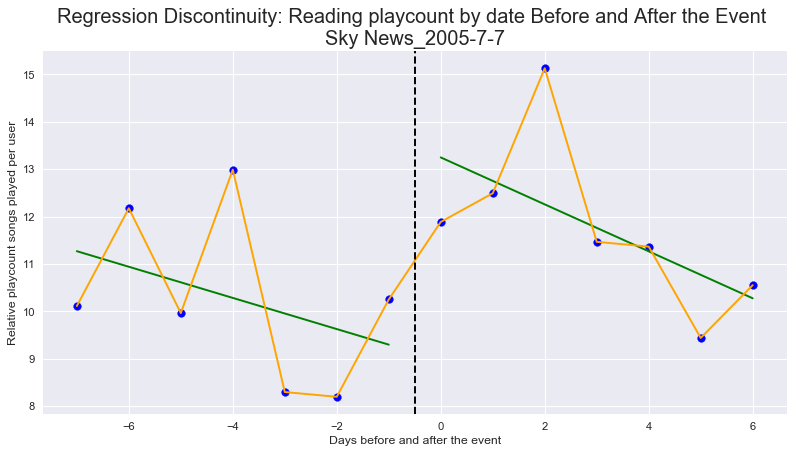


---------------------------------------------------------

R-squared: 0.797410796835

---------------------------------------------------------

Parameters

Intercept                  5.009199
threshold                 -0.615299
days_to_event              0.105772
threshold:days_to_event    0.035125
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.146525e-12
threshold                  6.103648e-03
days_to_event              6.562733e-03
threshold:days_to_event    4.407766e-01
dtype: float64

---------------------------------------------------------



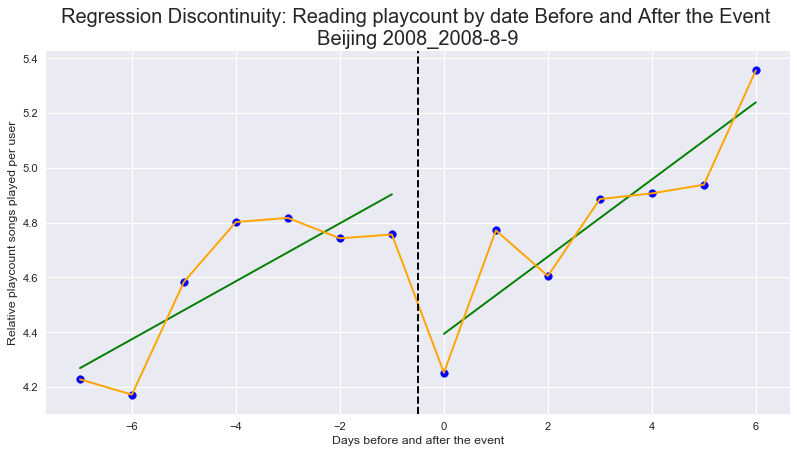


---------------------------------------------------------

R-squared: 0.451915473226

---------------------------------------------------------

Parameters

Intercept                  4.621131
threshold                  0.771163
days_to_event             -0.076098
threshold:days_to_event    0.022495
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.467931e-09
threshold                  2.227079e-02
days_to_event              1.567265e-01
threshold:days_to_event    7.555156e-01
dtype: float64

---------------------------------------------------------



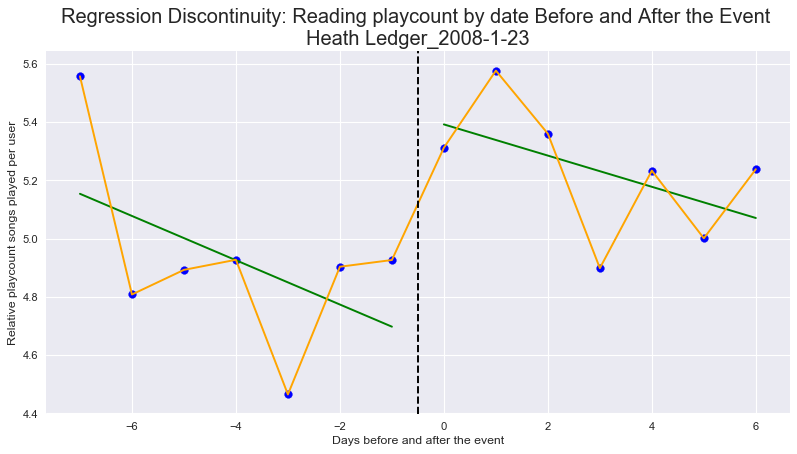


---------------------------------------------------------

R-squared: 0.794139339233

---------------------------------------------------------

Parameters

Intercept                  5.312974
threshold                 -0.443017
days_to_event              0.128092
threshold:days_to_event   -0.197203
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.663500e-13
threshold                  1.086773e-02
days_to_event              4.114421e-04
threshold:days_to_event    2.147988e-04
dtype: float64

---------------------------------------------------------



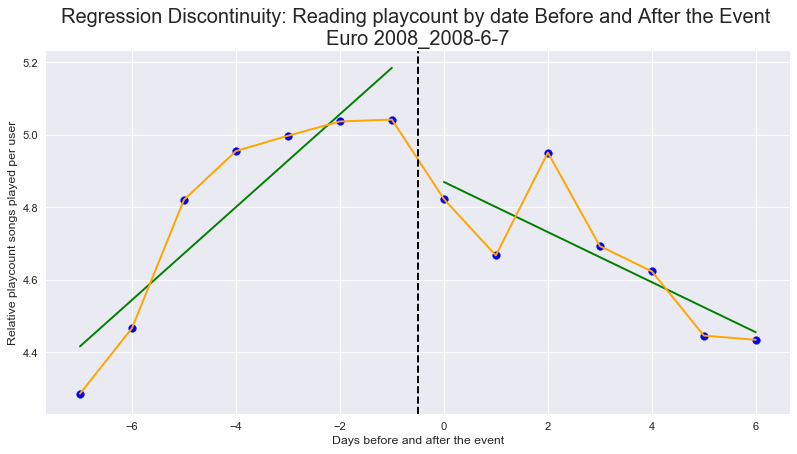


---------------------------------------------------------

R-squared: 0.797410796835

---------------------------------------------------------

Parameters

Intercept                  5.009199
threshold                 -0.615299
days_to_event              0.105772
threshold:days_to_event    0.035125
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.146525e-12
threshold                  6.103648e-03
days_to_event              6.562733e-03
threshold:days_to_event    4.407766e-01
dtype: float64

---------------------------------------------------------



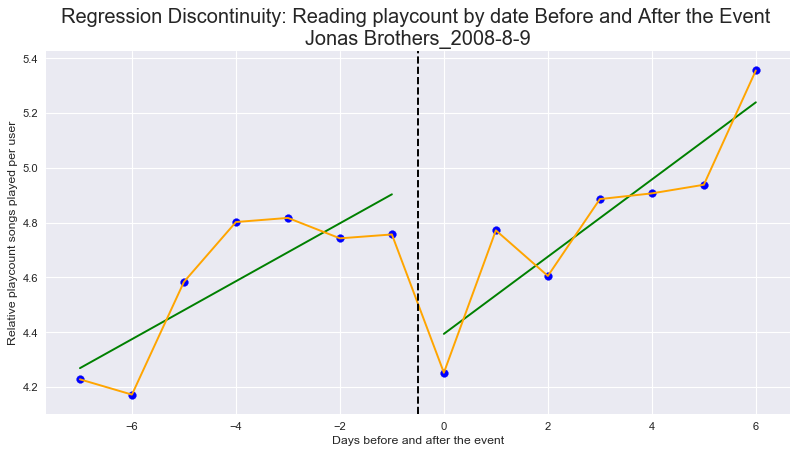


---------------------------------------------------------

R-squared: 0.70372176258

---------------------------------------------------------

Parameters

Intercept                  4.064019
threshold                 -0.511208
days_to_event              0.030489
threshold:days_to_event    0.058504
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.169334e-12
threshold                  1.860309e-03
days_to_event              1.817431e-01
threshold:days_to_event    8.008997e-02
dtype: float64

---------------------------------------------------------



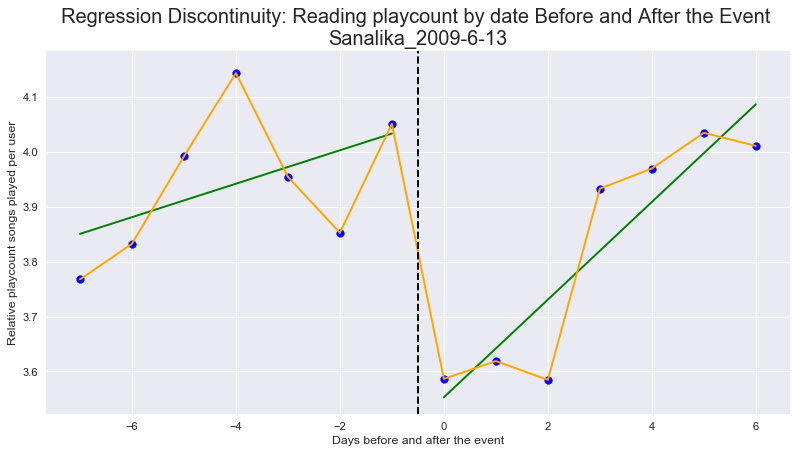


---------------------------------------------------------

R-squared: 0.734633480411

---------------------------------------------------------

Parameters

Intercept                  3.544382
threshold                 -0.685708
days_to_event             -0.047911
threshold:days_to_event    0.262861
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.907942e-09
threshold                  2.342007e-02
days_to_event              3.087378e-01
threshold:days_to_event    1.947538e-03
dtype: float64

---------------------------------------------------------



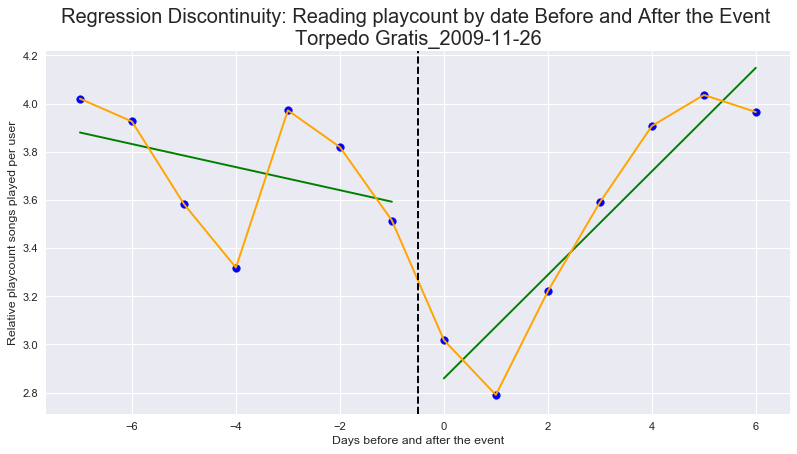


---------------------------------------------------------

R-squared: 0.710313545832

---------------------------------------------------------

Parameters

Intercept                  3.688462
threshold                 -0.494819
days_to_event              0.036946
threshold:days_to_event    0.103696
dtype: float64

---------------------------------------------------------

P-values

Intercept                  8.936869e-11
threshold                  1.622466e-02
days_to_event              2.440709e-01
threshold:days_to_event    3.387878e-02
dtype: float64

---------------------------------------------------------



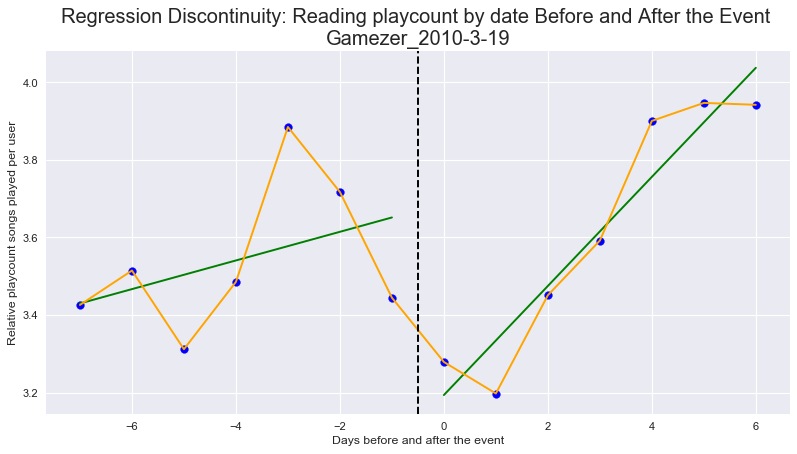


---------------------------------------------------------

R-squared: 0.534994279478

---------------------------------------------------------

Parameters

Intercept                  2.903333
threshold                  0.407587
days_to_event             -0.070425
threshold:days_to_event    0.014571
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.338215e-10
threshold                  2.464146e-02
days_to_event              2.548534e-02
threshold:days_to_event    7.092447e-01
dtype: float64

---------------------------------------------------------



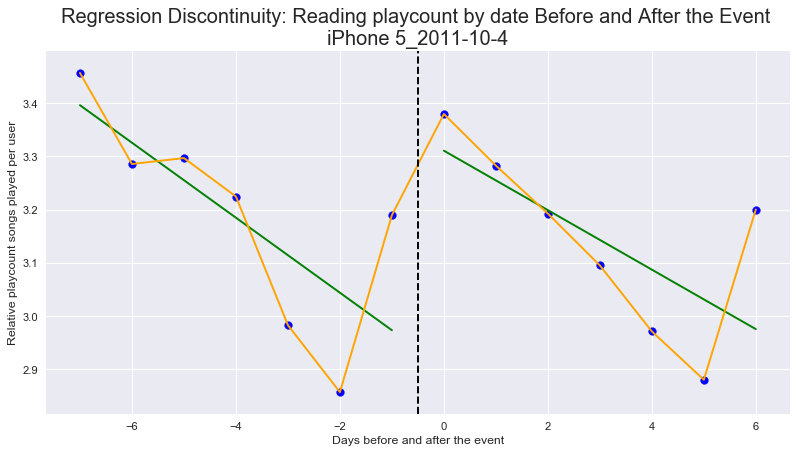

/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/statsmodels/base/model.py:1036: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)



---------------------------------------------------------

R-squared: 0.489909251104

---------------------------------------------------------

Parameters

Intercept                  2.735486
threshold                 -0.350563
days_to_event              0.049607
threshold:days_to_event   -0.000298
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.084321e-10
threshold                  2.218810e-02
days_to_event              5.266546e-02
threshold:days_to_event    9.927414e-01
dtype: float64

---------------------------------------------------------



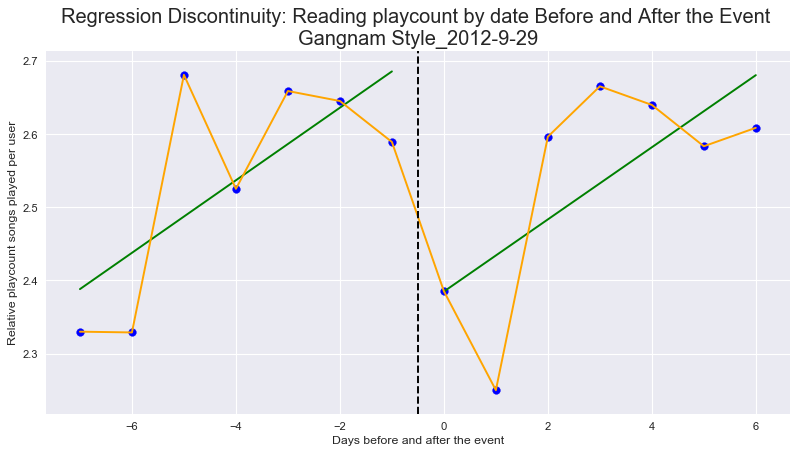


---------------------------------------------------------

R-squared: 0.623642569017

---------------------------------------------------------

Parameters

Intercept                  1.967888
threshold                  0.321556
days_to_event             -0.063774
threshold:days_to_event    0.023333
dtype: float64

---------------------------------------------------------

P-values

Intercept                  5.511953e-10
threshold                  1.523467e-02
days_to_event              7.622075e-03
threshold:days_to_event    4.091851e-01
dtype: float64

---------------------------------------------------------



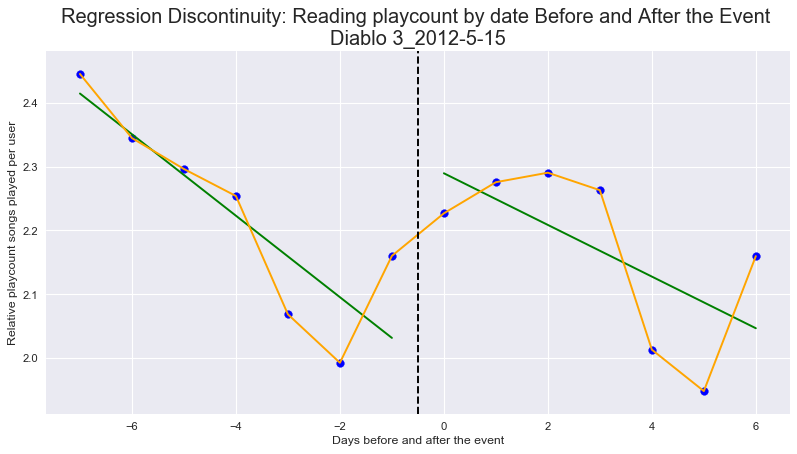


---------------------------------------------------------

R-squared: 0.439812012143

---------------------------------------------------------

Parameters

Intercept                  2.673912
threshold                 -0.279938
days_to_event              0.042068
threshold:days_to_event   -0.012325
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.002680e-11
threshold                  2.562355e-02
days_to_event              4.726767e-02
threshold:days_to_event    6.495076e-01
dtype: float64

---------------------------------------------------------



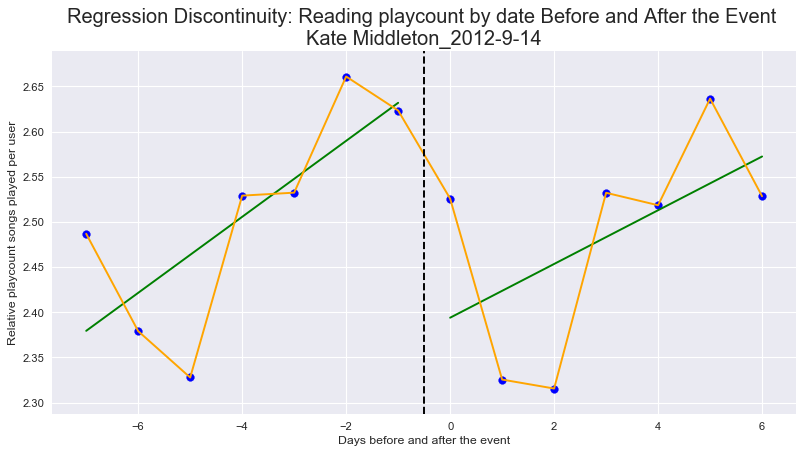


---------------------------------------------------------

R-squared: 0.922793717431

---------------------------------------------------------

Parameters

Intercept                  2.711192
threshold                 -0.343569
days_to_event              0.064521
threshold:days_to_event   -0.005888
dtype: float64

---------------------------------------------------------

P-values

Intercept                  7.107546e-15
threshold                  3.534917e-05
days_to_event              1.847647e-05
threshold:days_to_event    6.345984e-01
dtype: float64

---------------------------------------------------------



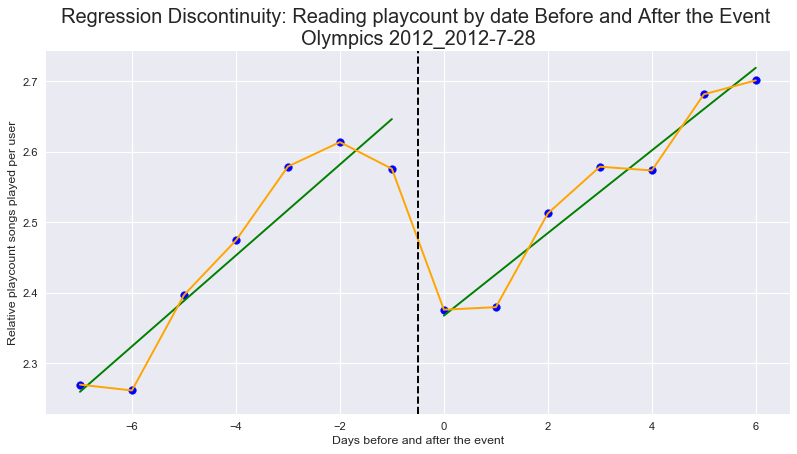


---------------------------------------------------------

R-squared: 0.719099042355

---------------------------------------------------------

Parameters

Intercept                  2.162666
threshold                  0.310663
days_to_event             -0.070543
threshold:days_to_event    0.063733
dtype: float64

---------------------------------------------------------

P-values

Intercept                  9.924254e-12
threshold                  3.171905e-03
days_to_event              5.125108e-04
threshold:days_to_event    9.256586e-03
dtype: float64

---------------------------------------------------------



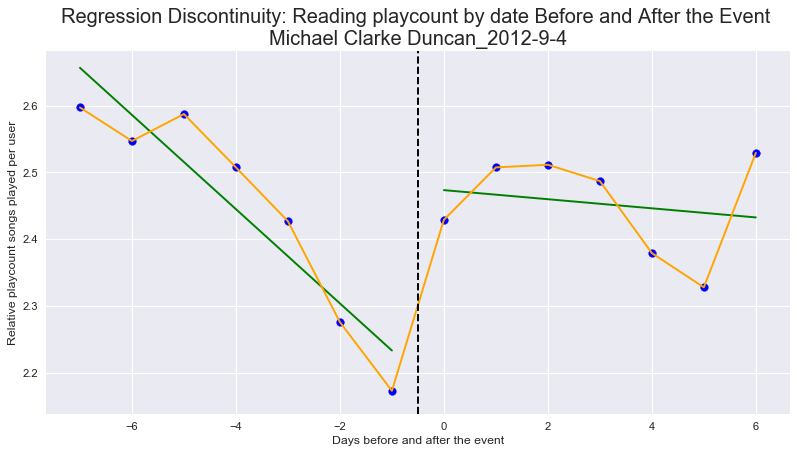


---------------------------------------------------------

R-squared: 0.368218599416

---------------------------------------------------------

Parameters

Intercept                  2.684274
threshold                  0.303782
days_to_event             -0.035072
threshold:days_to_event    0.000300
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.116397e-10
threshold                  3.859975e-02
days_to_event              1.455068e-01
threshold:days_to_event    9.925633e-01
dtype: float64

---------------------------------------------------------



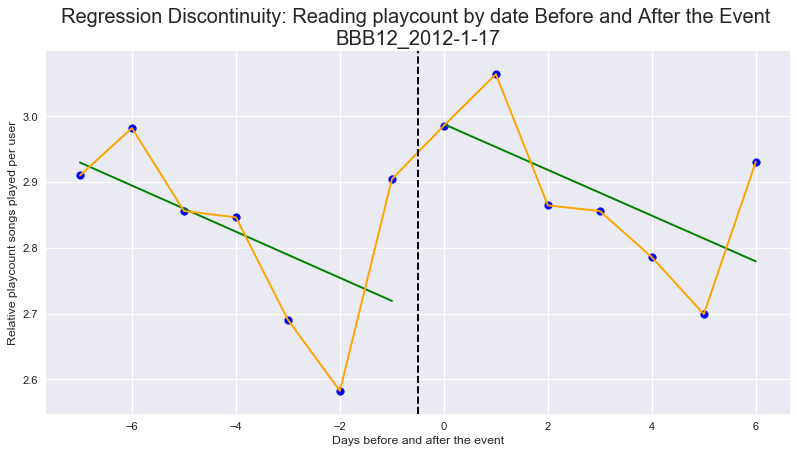


---------------------------------------------------------

R-squared: 0.615689492245

---------------------------------------------------------

Parameters

Intercept                  2.267106
threshold                  0.266705
days_to_event             -0.064192
threshold:days_to_event    0.071153
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.823186e-10
threshold                  2.680737e-02
days_to_event              4.592788e-03
threshold:days_to_event    2.998410e-02
dtype: float64

---------------------------------------------------------



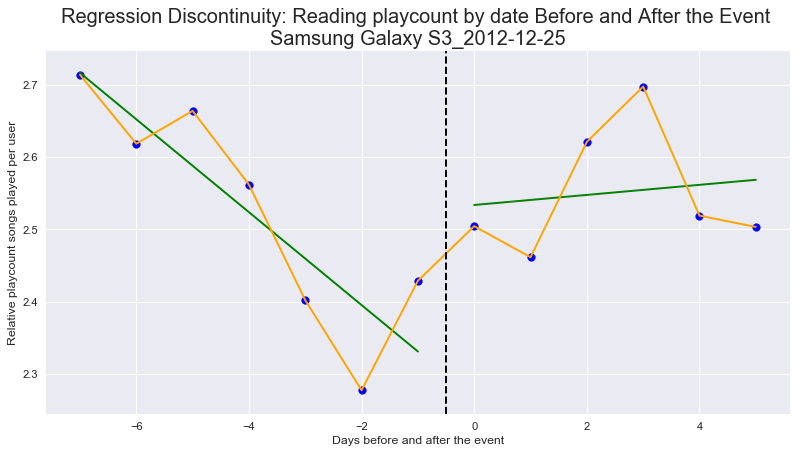


---------------------------------------------------------

R-squared: 0.615689492245

---------------------------------------------------------

Parameters

Intercept                  2.267106
threshold                  0.266705
days_to_event             -0.064192
threshold:days_to_event    0.071153
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.823186e-10
threshold                  2.680737e-02
days_to_event              4.592788e-03
threshold:days_to_event    2.998410e-02
dtype: float64

---------------------------------------------------------



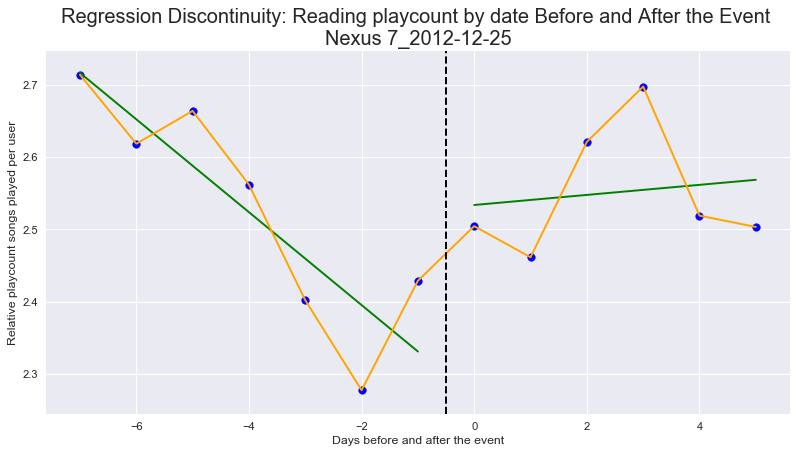


---------------------------------------------------------

R-squared: 0.615689492245

---------------------------------------------------------

Parameters

Intercept                  2.267106
threshold                  0.266705
days_to_event             -0.064192
threshold:days_to_event    0.071153
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.823186e-10
threshold                  2.680737e-02
days_to_event              4.592788e-03
threshold:days_to_event    2.998410e-02
dtype: float64

---------------------------------------------------------



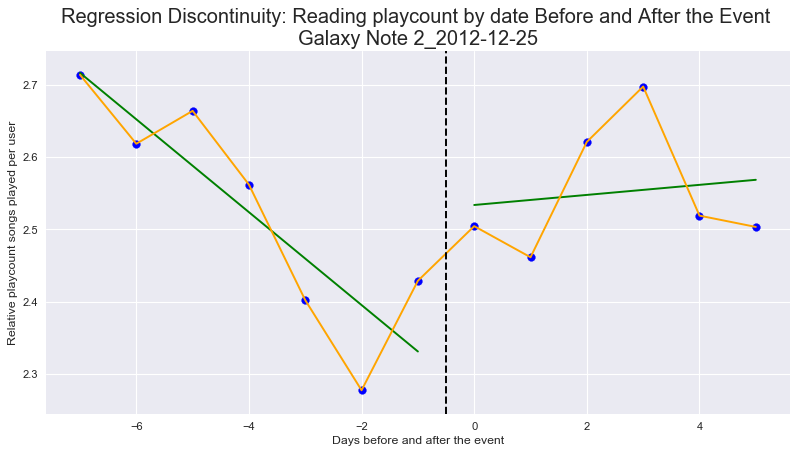


---------------------------------------------------------

R-squared: 0.615689492245

---------------------------------------------------------

Parameters

Intercept                  2.267106
threshold                  0.266705
days_to_event             -0.064192
threshold:days_to_event    0.071153
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.823186e-10
threshold                  2.680737e-02
days_to_event              4.592788e-03
threshold:days_to_event    2.998410e-02
dtype: float64

---------------------------------------------------------



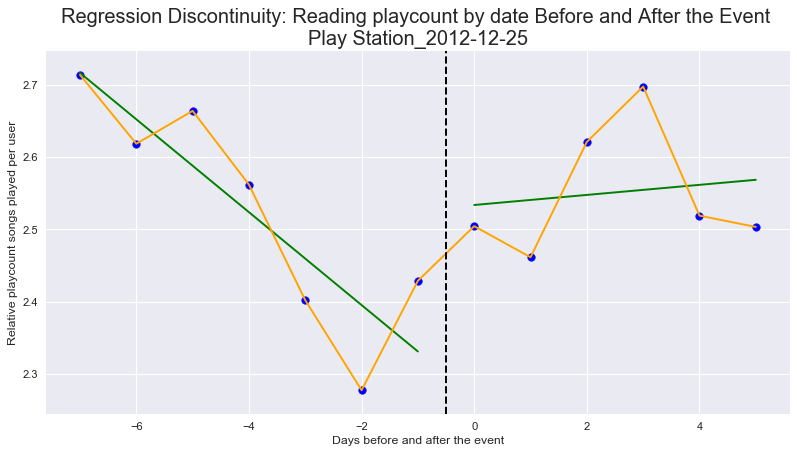


---------------------------------------------------------

R-squared: 0.615689492245

---------------------------------------------------------

Parameters

Intercept                  2.267106
threshold                  0.266705
days_to_event             -0.064192
threshold:days_to_event    0.071153
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.823186e-10
threshold                  2.680737e-02
days_to_event              4.592788e-03
threshold:days_to_event    2.998410e-02
dtype: float64

---------------------------------------------------------



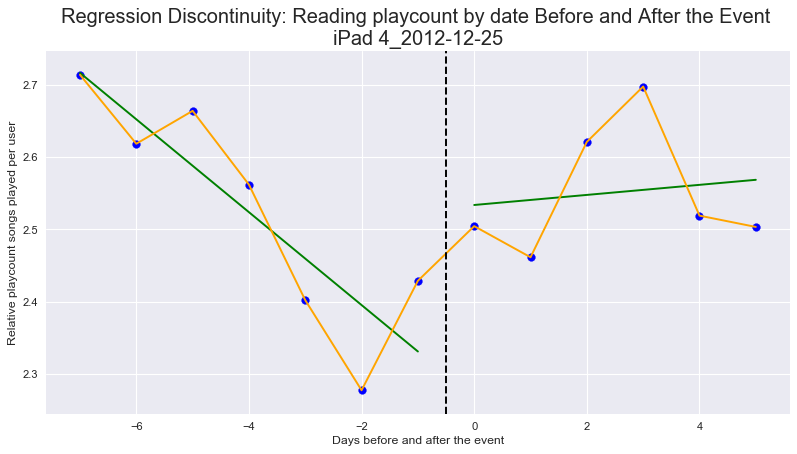


---------------------------------------------------------

R-squared: 0.460163867677

---------------------------------------------------------

Parameters

Intercept                  1.927280
threshold                  0.195212
days_to_event             -0.033686
threshold:days_to_event    0.032095
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.953637e-11
threshold                  2.933285e-02
days_to_event              3.046655e-02
threshold:days_to_event    1.206011e-01
dtype: float64

---------------------------------------------------------



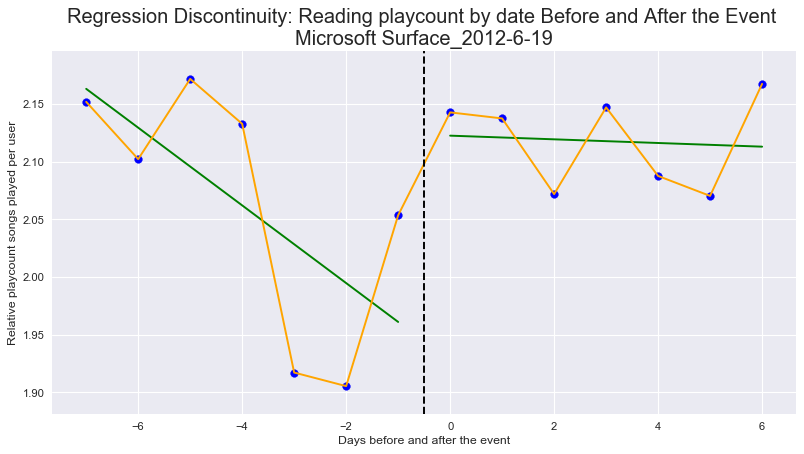


---------------------------------------------------------

R-squared: 0.615689492245

---------------------------------------------------------

Parameters

Intercept                  2.267106
threshold                  0.266705
days_to_event             -0.064192
threshold:days_to_event    0.071153
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.823186e-10
threshold                  2.680737e-02
days_to_event              4.592788e-03
threshold:days_to_event    2.998410e-02
dtype: float64

---------------------------------------------------------



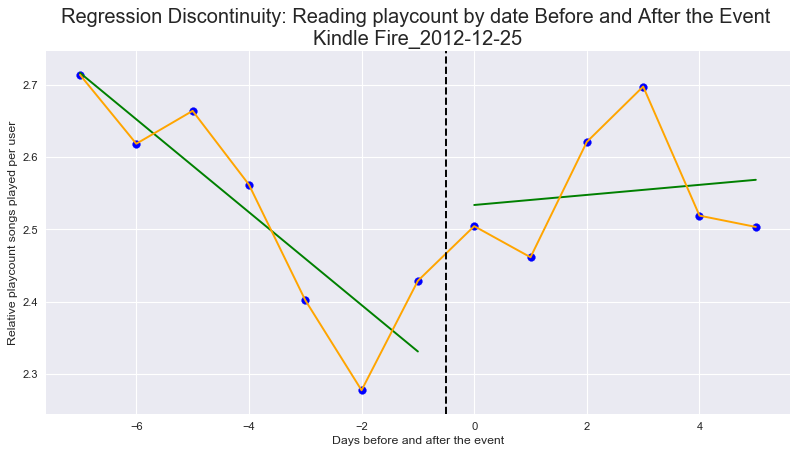


---------------------------------------------------------

R-squared: 0.543738176349

---------------------------------------------------------

Parameters

Intercept                  2.286685
threshold                  0.317941
days_to_event             -0.057654
threshold:days_to_event    0.035984
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.751192e-11
threshold                  1.170110e-02
days_to_event              9.407888e-03
threshold:days_to_event    1.875645e-01
dtype: float64

---------------------------------------------------------



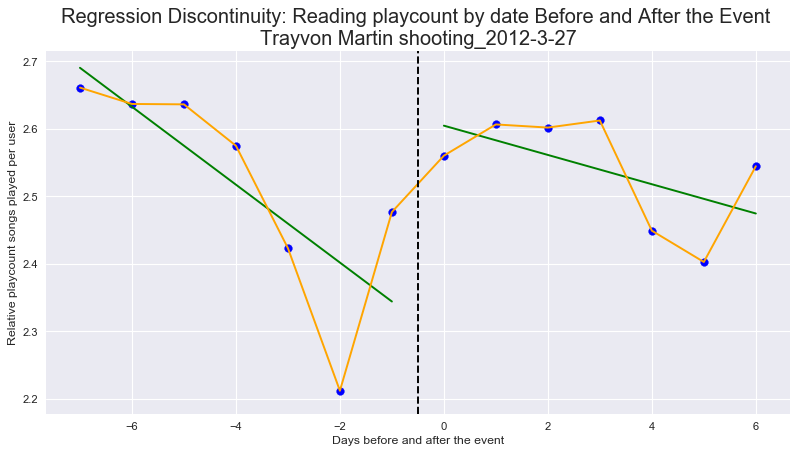


---------------------------------------------------------

R-squared: 0.436914452148

---------------------------------------------------------

Parameters

Intercept                  2.684494
threshold                 -0.251478
days_to_event              0.041174
threshold:days_to_event   -0.016180
dtype: float64

---------------------------------------------------------

P-values

Intercept                  9.675370e-12
threshold                  3.027218e-02
days_to_event              3.912446e-02
threshold:days_to_event    5.246748e-01
dtype: float64

---------------------------------------------------------



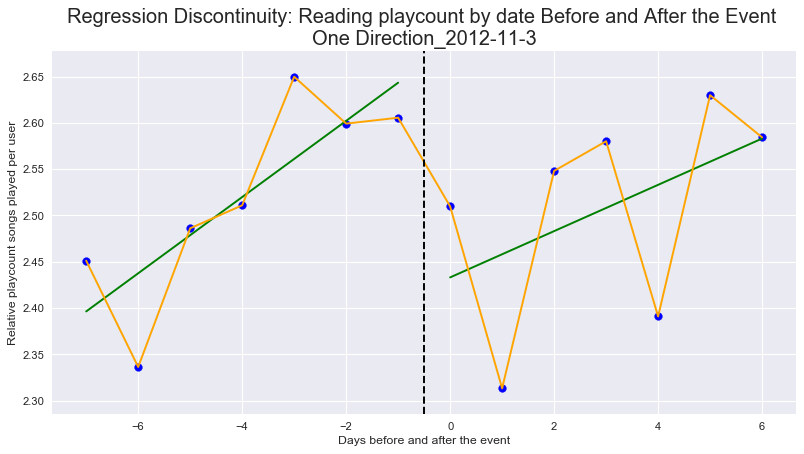


---------------------------------------------------------

R-squared: 0.796390201873

---------------------------------------------------------

Parameters

Intercept                  2.125737
threshold                  0.308279
days_to_event             -0.054087
threshold:days_to_event   -0.009399
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.592531e-11
threshold                  4.019285e-03
days_to_event              3.830576e-03
threshold:days_to_event    6.554457e-01
dtype: float64

---------------------------------------------------------



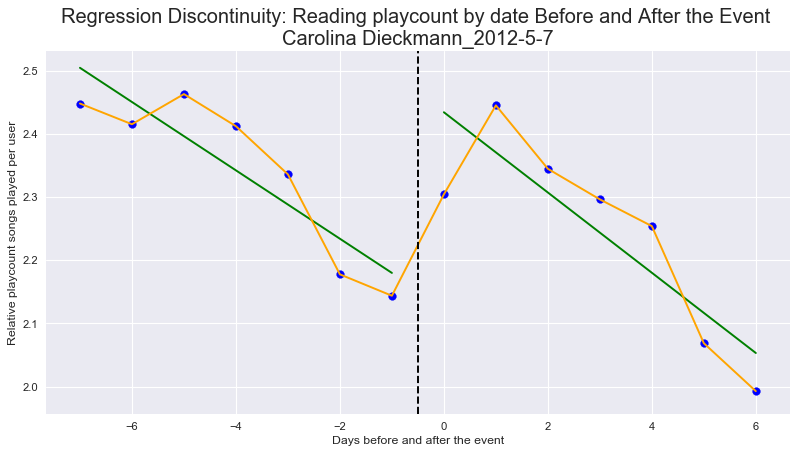


---------------------------------------------------------

R-squared: 0.413945608984

---------------------------------------------------------

Parameters

Intercept                  3.014441
threshold                 -0.256765
days_to_event              0.033991
threshold:days_to_event   -0.000744
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.663617e-12
threshold                  3.320287e-02
days_to_event              8.995489e-02
threshold:days_to_event    9.773821e-01
dtype: float64

---------------------------------------------------------



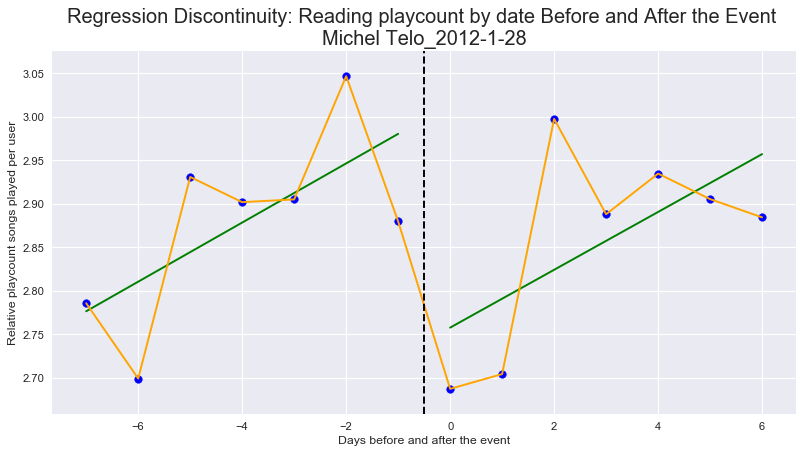


---------------------------------------------------------

R-squared: 0.146777974856

---------------------------------------------------------

Parameters

Intercept                  1.492334
threshold                  1.492334
days_to_event             -0.013060
threshold:days_to_event   -0.013060
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000017
threshold                  0.000017
days_to_event              0.453442
threshold:days_to_event    0.453442
dtype: float64

---------------------------------------------------------



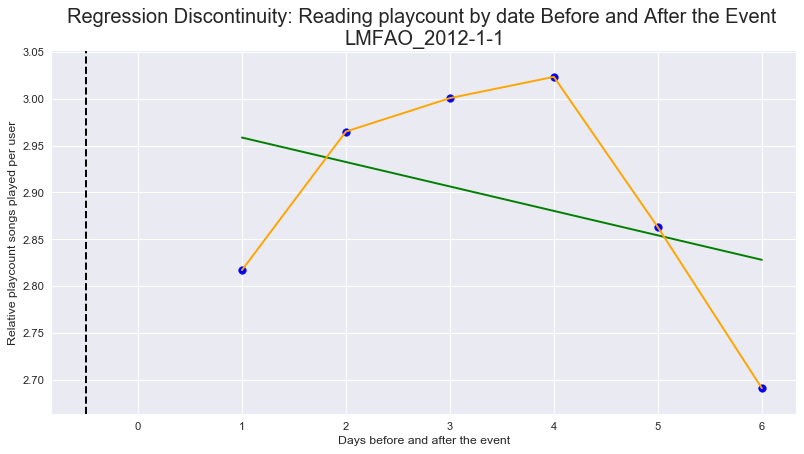


---------------------------------------------------------

R-squared: 0.518230117251

---------------------------------------------------------

Parameters

Intercept                  2.649993
threshold                  0.361061
days_to_event             -0.037966
threshold:days_to_event   -0.005741
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.589026e-11
threshold                  9.268520e-03
days_to_event              8.089047e-02
threshold:days_to_event    8.397321e-01
dtype: float64

---------------------------------------------------------



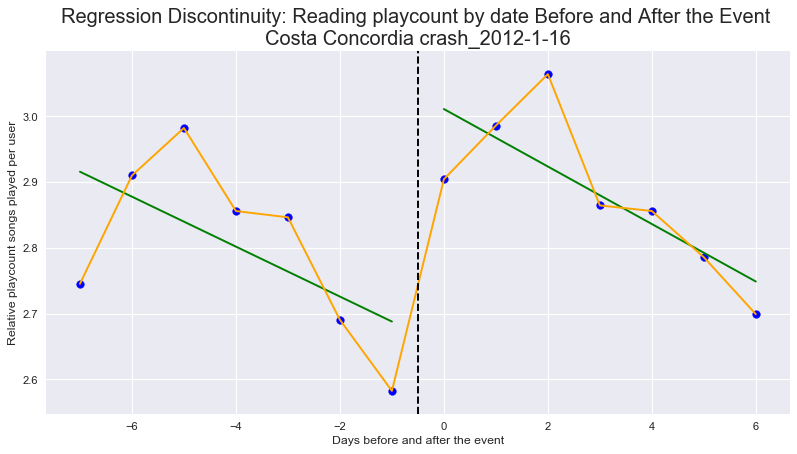


---------------------------------------------------------

R-squared: 0.730088367951

---------------------------------------------------------

Parameters

Intercept                  3.529999
threshold                 -0.610716
days_to_event              0.135882
threshold:days_to_event   -0.047566
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.883193e-10
threshold                  1.064186e-02
days_to_event              2.502106e-03
threshold:days_to_event    3.450124e-01
dtype: float64

---------------------------------------------------------



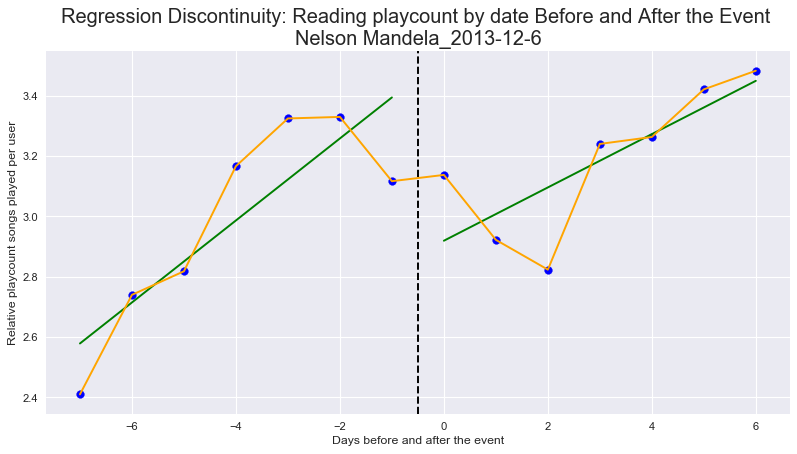


---------------------------------------------------------

R-squared: 0.422188922506

---------------------------------------------------------

Parameters

Intercept                  2.800244
threshold                  0.362703
days_to_event             -0.039051
threshold:days_to_event   -0.014203
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.532244e-10
threshold                  3.106436e-02
days_to_event              1.520307e-01
threshold:days_to_event    6.984357e-01
dtype: float64

---------------------------------------------------------



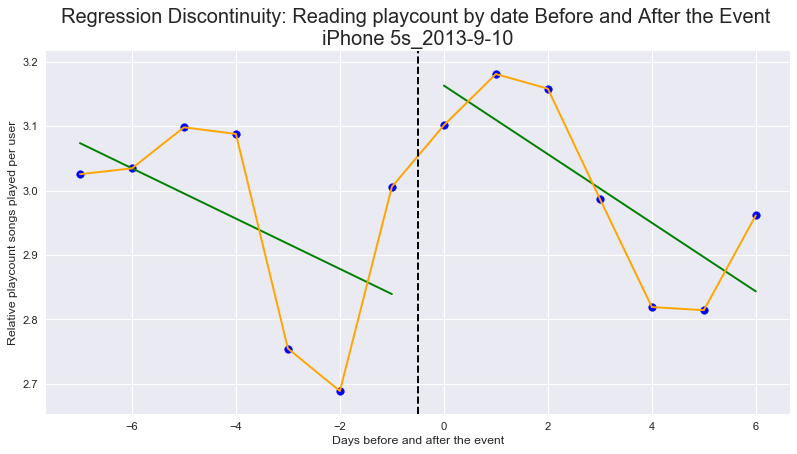


---------------------------------------------------------

R-squared: 0.562816017034

---------------------------------------------------------

Parameters

Intercept                  2.913157
threshold                 -0.243254
days_to_event              0.054011
threshold:days_to_event   -0.029986
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.616551e-12
threshold                  3.240869e-02
days_to_event              1.005075e-02
threshold:days_to_event    2.422184e-01
dtype: float64

---------------------------------------------------------



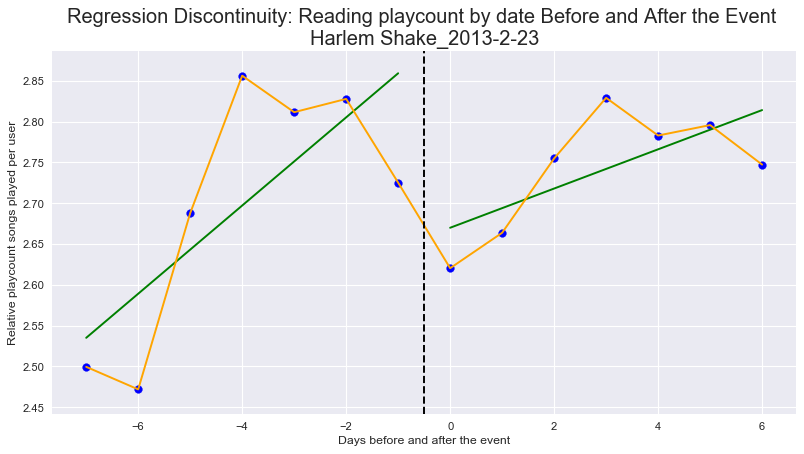


---------------------------------------------------------

R-squared: 0.914752899417

---------------------------------------------------------

Parameters

Intercept                  3.077102
threshold                 -0.438570
days_to_event              0.085605
threshold:days_to_event   -0.044317
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.573267e-15
threshold                  8.726442e-06
days_to_event              3.135524e-06
threshold:days_to_event    6.799304e-03
dtype: float64

---------------------------------------------------------



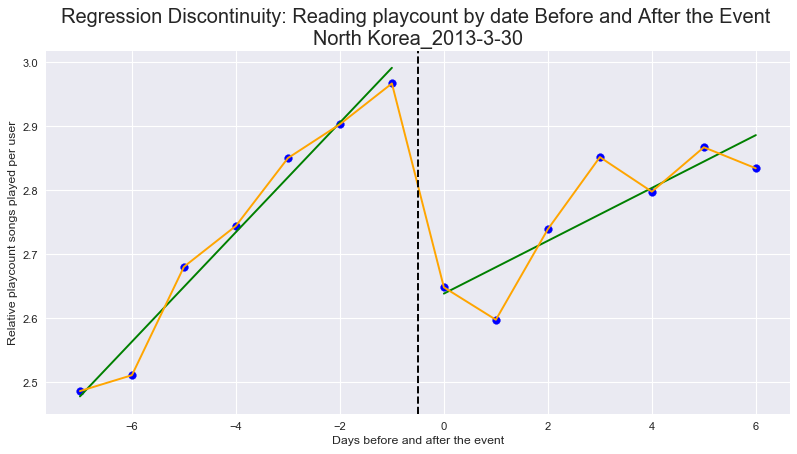


---------------------------------------------------------

R-squared: 0.584807899357

---------------------------------------------------------

Parameters

Intercept                  3.089326
threshold                 -0.400282
days_to_event              0.068411
threshold:days_to_event   -0.001260
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.586537e-10
threshold                  2.517194e-02
days_to_event              2.732904e-02
threshold:days_to_event    9.738422e-01
dtype: float64

---------------------------------------------------------



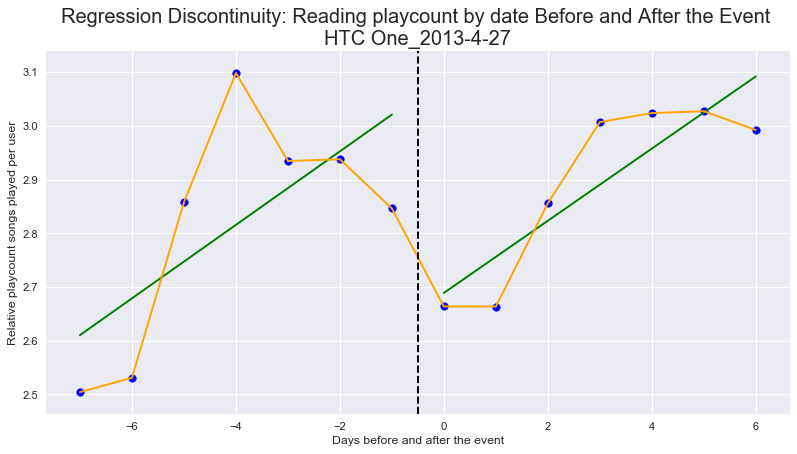


---------------------------------------------------------

R-squared: 0.565868790445

---------------------------------------------------------

Parameters

Intercept                  3.522983
threshold                 -0.347963
days_to_event              0.095115
threshold:days_to_event   -0.097799
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.279428e-11
threshold                  4.510162e-02
days_to_event              4.895626e-03
threshold:days_to_event    2.590178e-02
dtype: float64

---------------------------------------------------------



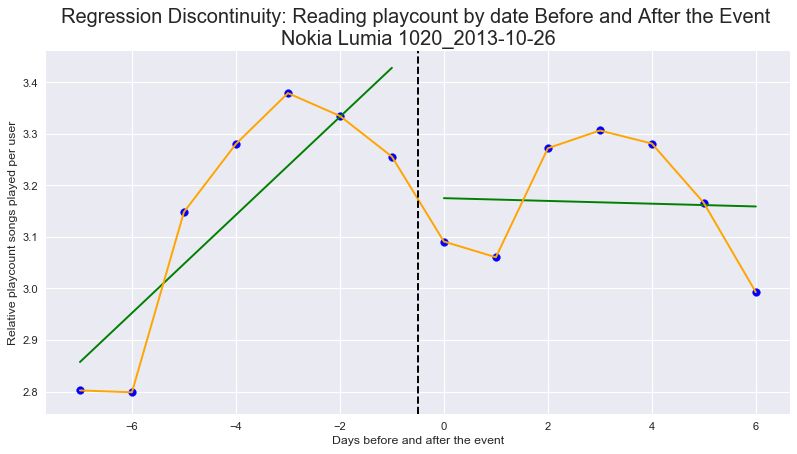


---------------------------------------------------------

R-squared: 0.457605383969

---------------------------------------------------------

Parameters

Intercept                  2.792765
threshold                  0.462316
days_to_event             -0.048463
threshold:days_to_event   -0.019446
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.352024e-09
threshold                  2.223428e-02
days_to_event              1.347634e-01
threshold:days_to_event    6.541941e-01
dtype: float64

---------------------------------------------------------



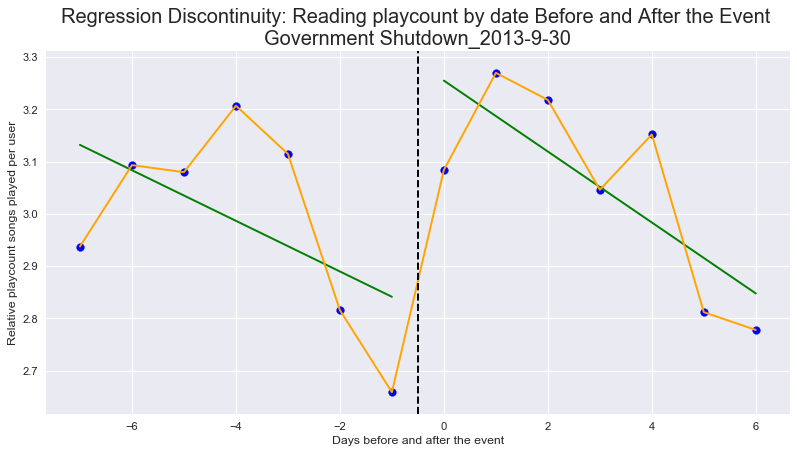


---------------------------------------------------------

R-squared: 0.730088367951

---------------------------------------------------------

Parameters

Intercept                  3.529999
threshold                 -0.610716
days_to_event              0.135882
threshold:days_to_event   -0.047566
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.883193e-10
threshold                  1.064186e-02
days_to_event              2.502106e-03
threshold:days_to_event    3.450124e-01
dtype: float64

---------------------------------------------------------



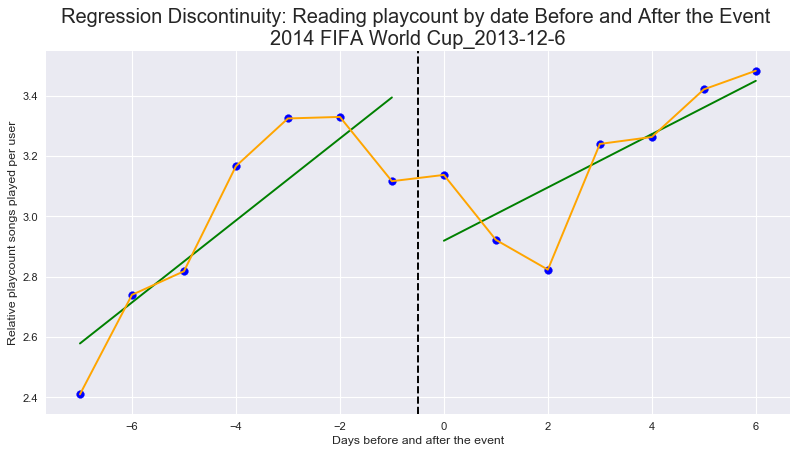


---------------------------------------------------------

R-squared: 0.741486988569

---------------------------------------------------------

Parameters

Intercept                  2.937752
threshold                 -0.451533
days_to_event              0.047108
threshold:days_to_event    0.035095
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.867551e-12
threshold                  1.264785e-03
days_to_event              2.398671e-02
threshold:days_to_event    1.917353e-01
dtype: float64

---------------------------------------------------------



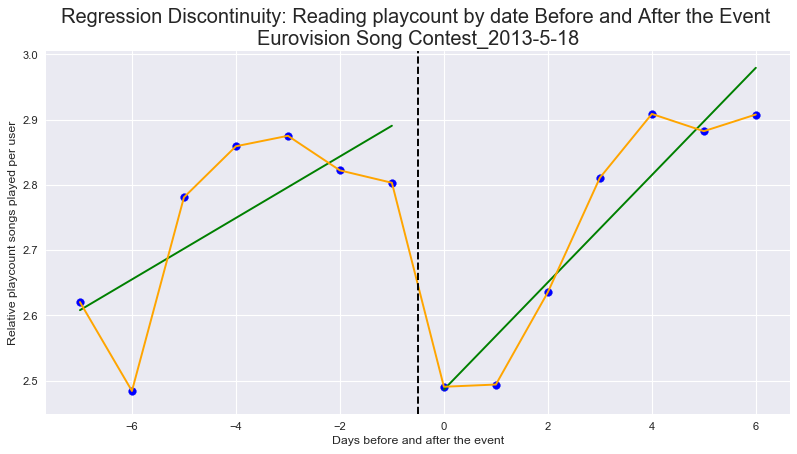


---------------------------------------------------------

R-squared: 0.604103295269

---------------------------------------------------------

Parameters

Intercept                  2.527322
threshold                  0.546278
days_to_event             -0.085209
threshold:days_to_event    0.046159
dtype: float64

---------------------------------------------------------

P-values

Intercept                  7.240377e-10
threshold                  3.721651e-03
days_to_event              7.130851e-03
threshold:days_to_event    2.258950e-01
dtype: float64

---------------------------------------------------------



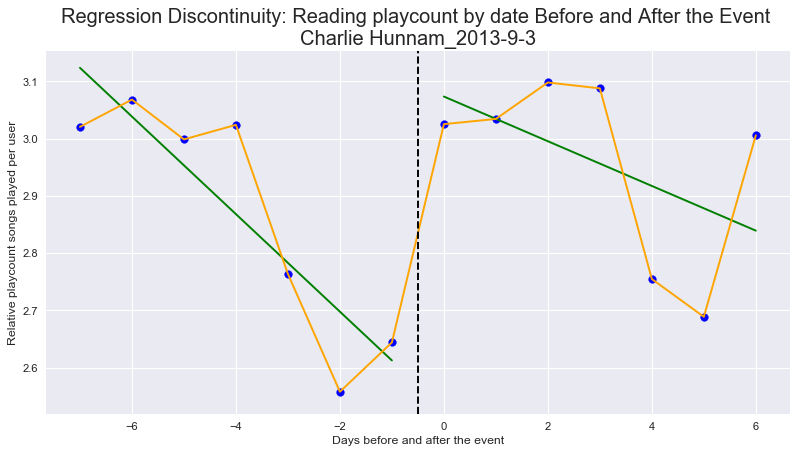


---------------------------------------------------------

R-squared: 0.556537839815

---------------------------------------------------------

Parameters

Intercept                  2.476896
threshold                  0.332386
days_to_event             -0.059692
threshold:days_to_event    0.037193
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.429876e-11
threshold                  9.818105e-03
days_to_event              8.278927e-03
threshold:days_to_event    1.789396e-01
dtype: float64

---------------------------------------------------------



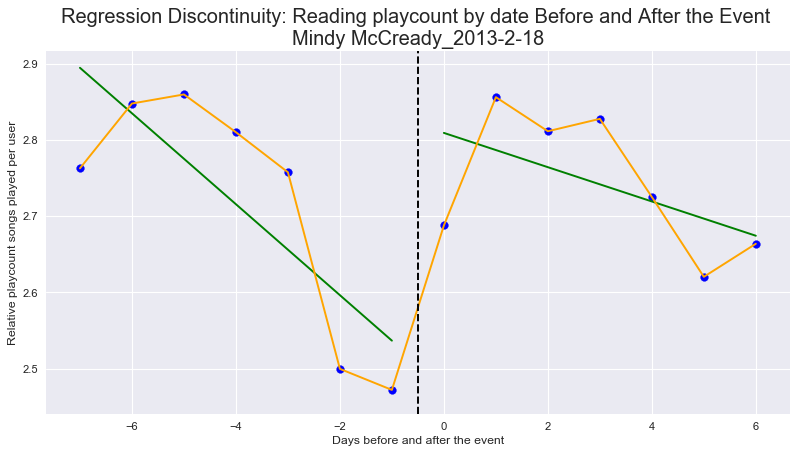


---------------------------------------------------------

R-squared: 0.658624749318

---------------------------------------------------------

Parameters

Intercept                  2.528212
threshold                  0.372326
days_to_event             -0.076880
threshold:days_to_event    0.013838
dtype: float64

---------------------------------------------------------

P-values

Intercept                  5.831962e-10
threshold                  2.564661e-02
days_to_event              1.112739e-02
threshold:days_to_event    7.008609e-01
dtype: float64

---------------------------------------------------------



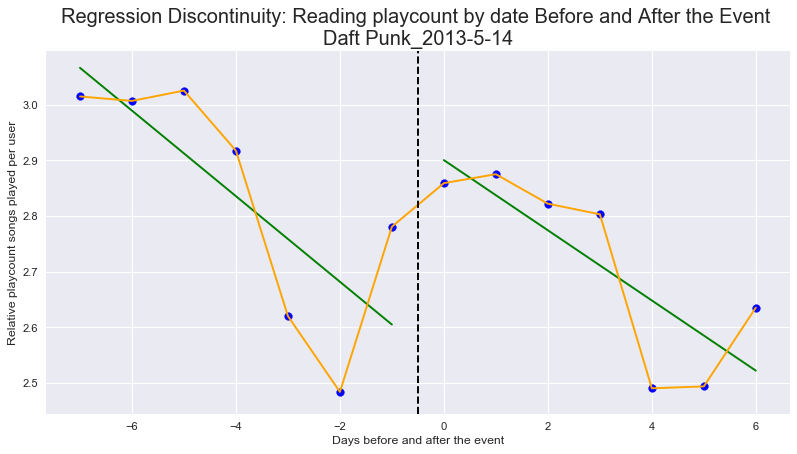


---------------------------------------------------------

R-squared: 0.604103295269

---------------------------------------------------------

Parameters

Intercept                  2.527322
threshold                  0.546278
days_to_event             -0.085209
threshold:days_to_event    0.046159
dtype: float64

---------------------------------------------------------

P-values

Intercept                  7.240377e-10
threshold                  3.721651e-03
days_to_event              7.130851e-03
threshold:days_to_event    2.258950e-01
dtype: float64

---------------------------------------------------------



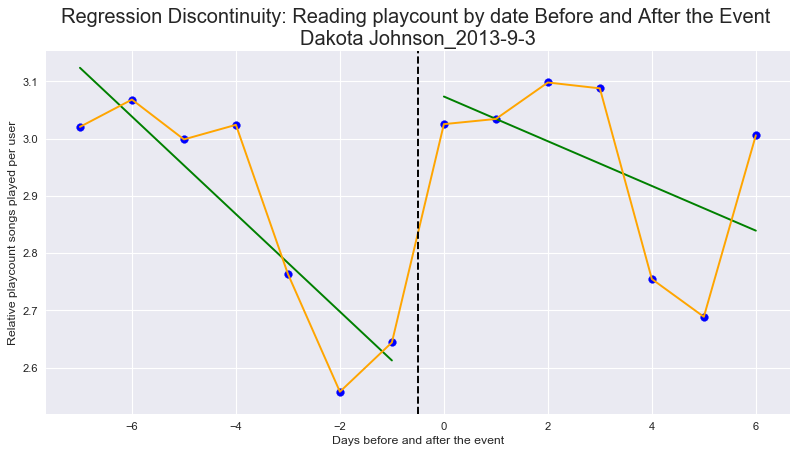


---------------------------------------------------------

R-squared: 0.666597638263

---------------------------------------------------------

Parameters

Intercept                  3.587386
threshold                 -0.517931
days_to_event              0.074830
threshold:days_to_event   -0.021888
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.671796e-12
threshold                  1.597283e-03
days_to_event              5.207988e-03
threshold:days_to_event    4.788316e-01
dtype: float64

---------------------------------------------------------



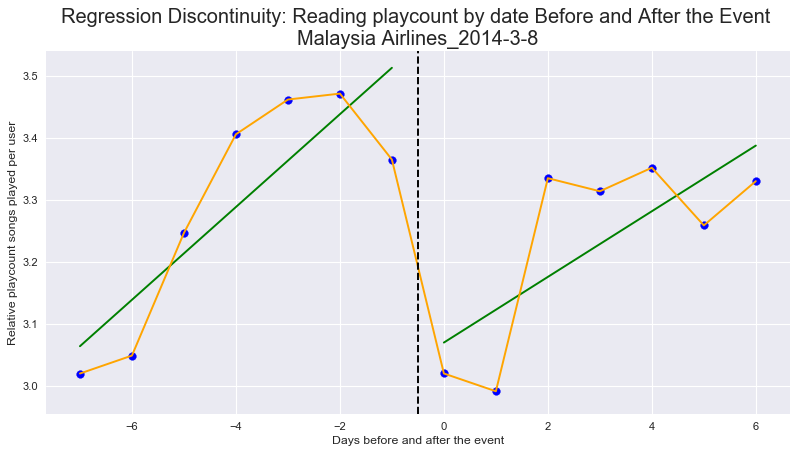


---------------------------------------------------------

R-squared: 0.795362084276

---------------------------------------------------------

Parameters

Intercept                  1.068380
threshold                  0.276200
days_to_event             -0.057443
threshold:days_to_event    0.063107
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.511971e-10
threshold                  6.808866e-04
days_to_event              1.769612e-04
threshold:days_to_event    1.156297e-03
dtype: float64

---------------------------------------------------------



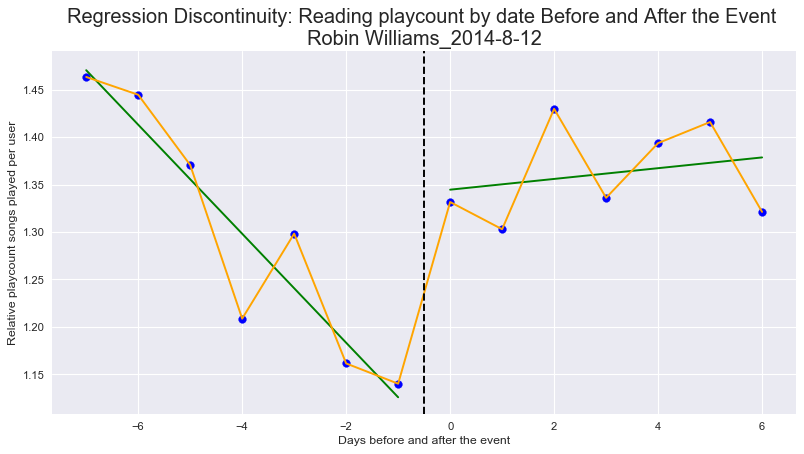


---------------------------------------------------------

R-squared: 0.865835547811

---------------------------------------------------------

Parameters

Intercept                  1.504695
threshold                 -0.184108
days_to_event              0.020695
threshold:days_to_event   -0.071994
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.945587e-10
threshold                  3.529706e-02
days_to_event              1.473131e-01
threshold:days_to_event    3.140212e-03
dtype: float64

---------------------------------------------------------



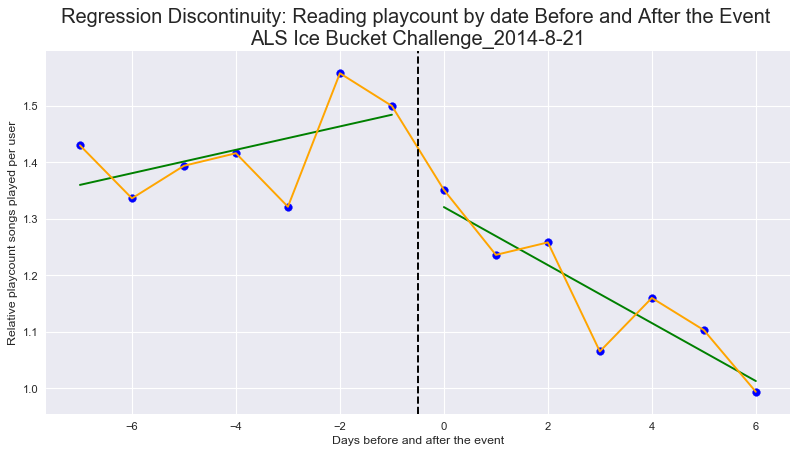


---------------------------------------------------------

R-squared: 0.68130275293

---------------------------------------------------------

Parameters

Intercept                  3.439911
threshold                 -0.423128
days_to_event              0.046735
threshold:days_to_event    0.037173
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.992488e-12
threshold                  5.356282e-03
days_to_event              4.849578e-02
threshold:days_to_event    2.351392e-01
dtype: float64

---------------------------------------------------------



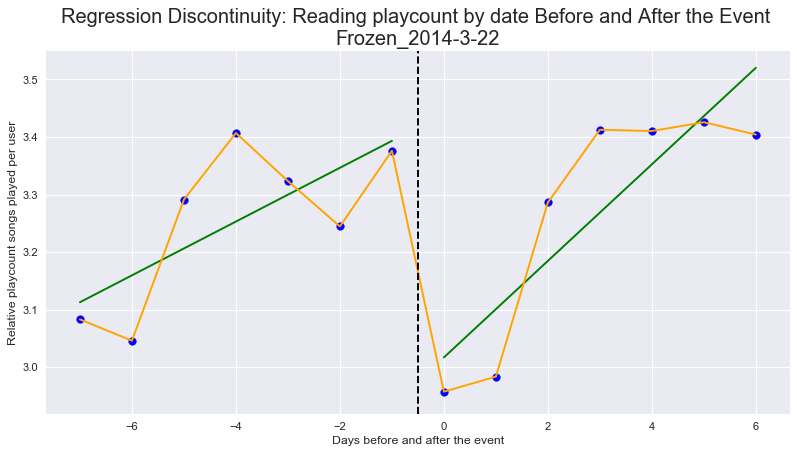


---------------------------------------------------------

R-squared: 0.515629105631

---------------------------------------------------------

Parameters

Intercept                  3.518255
threshold                 -0.300517
days_to_event              0.054376
threshold:days_to_event   -0.027251
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.326866e-12
threshold                  1.851420e-02
days_to_event              1.531385e-02
threshold:days_to_event    3.252282e-01
dtype: float64

---------------------------------------------------------



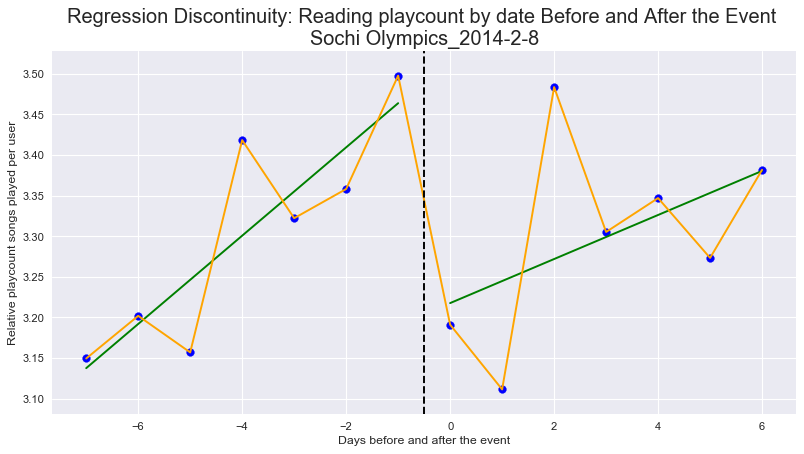


---------------------------------------------------------

R-squared: 0.68130275293

---------------------------------------------------------

Parameters

Intercept                  3.439911
threshold                 -0.423128
days_to_event              0.046735
threshold:days_to_event    0.037173
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.992488e-12
threshold                  5.356282e-03
days_to_event              4.849578e-02
threshold:days_to_event    2.351392e-01
dtype: float64

---------------------------------------------------------



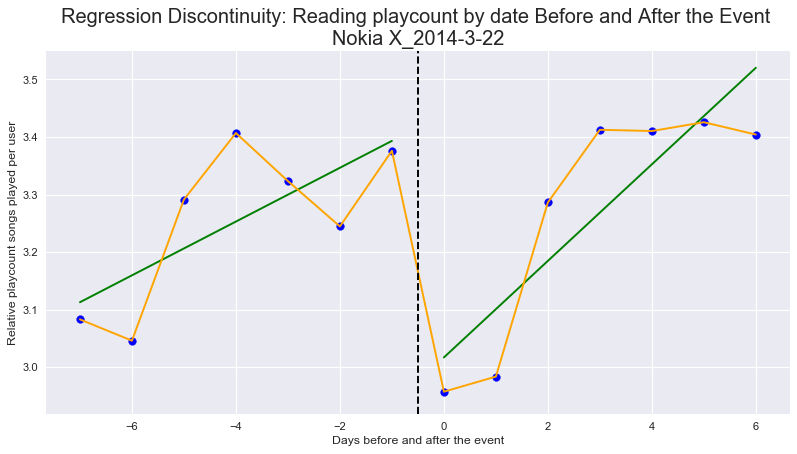

In [31]:
for year in list(set(DF['year'])):
    
    df_focus = DF[(DF.year == year)]

    for index, row in events_filtered.iterrows():
        if row.year == year:
            dateEvent = row.date
            dateBefore = row.date - timedelta(days=N)
            dateAfter = row.date + timedelta(days=N)

            def threshold(size):
                if(size>=dateEvent):
                    return 1
                return 0

            def days_to_event(size):
                delta = size - dateEvent
                return delta.days
            
            def linear_decrease_from_event(size):
                delta = size - dateEvent
                if delta.days < 0:
                    return 0
                else:
                    value = 7 - delta.days
                    return value
            
            def exp_decrease_from_event(size):
                delta = size - dateEvent
                if delta.days < 0:
                    return 0
                else:
                    value = 49 - math.pow(delta.days, 2)
                    return value

            # ONLY FOR X DAYS BEFORE AND AFTER THE EVENT
            data = df_focus[(df_focus.index < dateAfter) & (df_focus.index >= dateBefore)]

            # WHEN THE FILTERING RETURNS AN EMPTY DATAFRAME => CONTINUE
            if not list(data['rel_play']): 
                continue

            data['threshold'] = data.index.map(threshold)
            data['days_to_event'] = data.index.map(days_to_event)
            data['linear_decrease_after_event'] = data.index.map(linear_decrease_from_event)
            data['exp_decrease_after_event'] = data.index.map(exp_decrease_from_event)
            
            result = sm.ols(formula="rel_play ~ threshold + days_to_event + threshold * days_to_event", data=data).fit()

            # If sinificant, plot lines
            if result.pvalues['threshold'] <0.05:
                
                #print(result.summary())
                print('')
                print('---------------------------------------------------------')
                print('')
                
                print('R-squared: %s' % result.rsquared)
                
                print('')
                print('---------------------------------------------------------')
                print('')
                print('Parameters')
                print('')
                print(result.params)
                print('')
                print('---------------------------------------------------------')
                print('')
                print('P-values')
                print('')
                print(result.pvalues)
                print('')
                print('---------------------------------------------------------')
                print('')
                 
                plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
                plt.scatter(data.days_to_event,data.rel_play, color="blue")
                plt.plot(data.days_to_event[:7], result.predict()[:7], '-', color='green')
                plt.plot(data.days_to_event[7:], result.predict()[7:], '-', color='green')
                plt.plot(data.days_to_event, data.rel_play, '-', color='orange')
                plt.axvline(x=-0.5,color="black", linestyle="--")
                plt.xlabel('Days before and after the event')
                plt.ylabel('Relative playcount songs played per user')
                plt.title("Regression Discontinuity: Reading playcount by date Before and After the Event \n" + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day), fontsize="18")
                #plt.savefig('../data/figures/RDD_' + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day) + '.png', dpi=300)
                #plt.close()
                plt.show()


The residual component has a large influence on the data. This might easily cause discontinuities. Therefore we try using the trend component only.

/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu


---------------------------------------------------------

R-squared: 0.961009657821

---------------------------------------------------------

Parameters

Intercept                  2337.685714
threshold                   122.221429
days_to_event                23.341071
threshold:days_to_event      -3.819643
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.065509e-15
threshold                  8.178663e-03
days_to_event              4.791501e-03
threshold:days_to_event    6.852148e-01
dtype: float64

---------------------------------------------------------



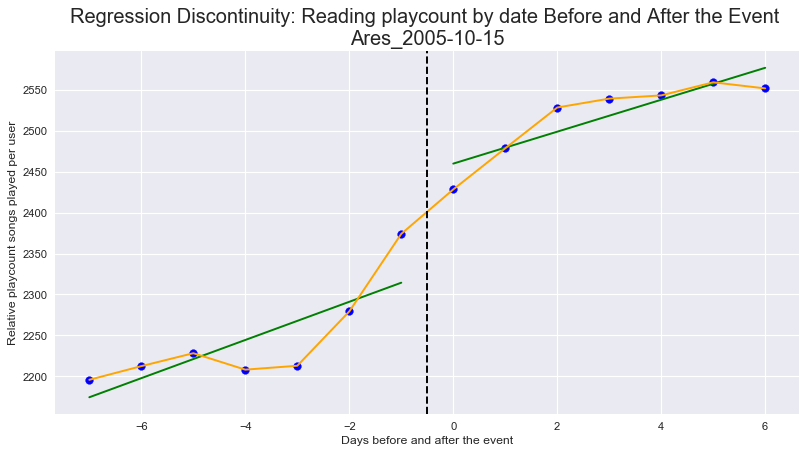


---------------------------------------------------------

R-squared: 0.986876716635

---------------------------------------------------------

Parameters

Intercept                  3231.528571
threshold                   -71.080357
days_to_event                61.591071
threshold:days_to_event    -115.707143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.672558e-20
threshold                  2.037109e-03
days_to_event              1.631376e-09
threshold:days_to_event    9.983919e-11
dtype: float64

---------------------------------------------------------



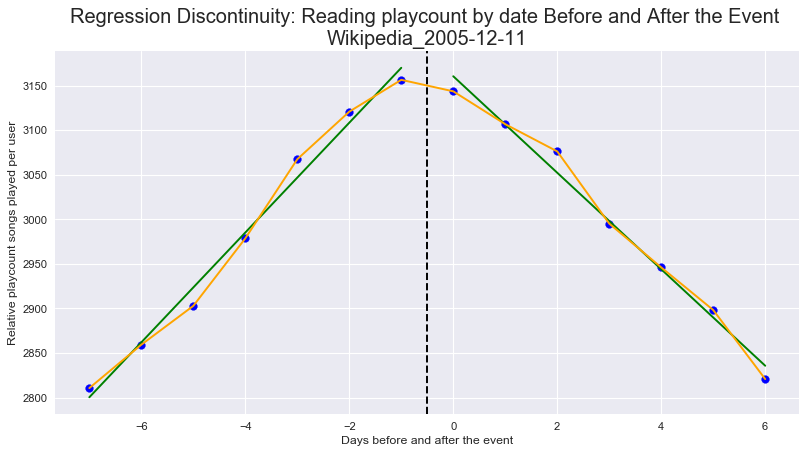


---------------------------------------------------------

R-squared: 0.728584002602

---------------------------------------------------------

Parameters

Intercept                  1983.578571
threshold                    85.900000
days_to_event                 5.853571
threshold:days_to_event     -11.682143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.056451e-14
threshold                  4.331373e-02
days_to_event              3.866020e-01
threshold:days_to_event    2.302720e-01
dtype: float64

---------------------------------------------------------



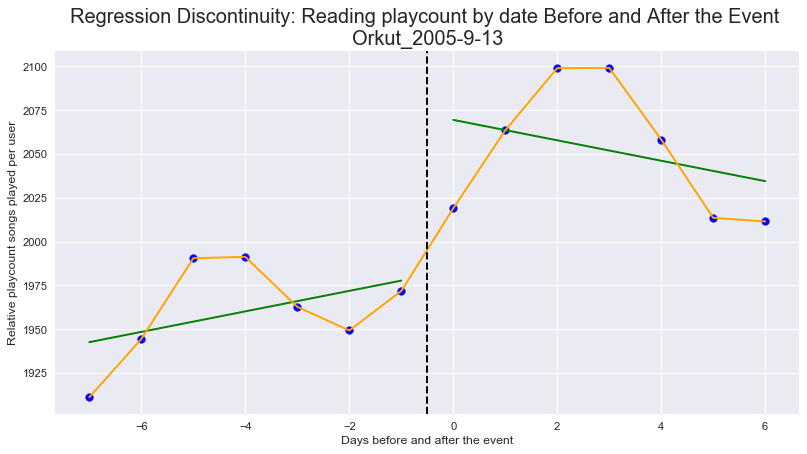


---------------------------------------------------------

R-squared: 0.98937849214

---------------------------------------------------------

Parameters

Intercept                  8286.414286
threshold                  -298.216071
days_to_event              -208.500000
threshold:days_to_event     158.612500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  7.356005e-17
threshold                  1.015569e-02
days_to_event              1.720845e-07
threshold:days_to_event    4.583260e-05
dtype: float64

---------------------------------------------------------



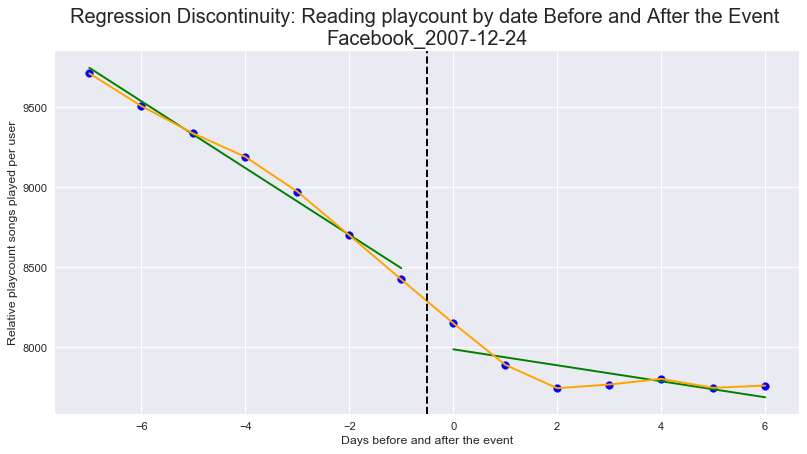


---------------------------------------------------------

R-squared: 0.984395634171

---------------------------------------------------------

Parameters

Intercept                  8828.771429
threshold                  -287.296429
days_to_event              -170.617857
threshold:days_to_event      13.207143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  8.287406e-16
threshold                  4.880972e-02
days_to_event              1.738793e-05
threshold:days_to_event    6.842724e-01
dtype: float64

---------------------------------------------------------



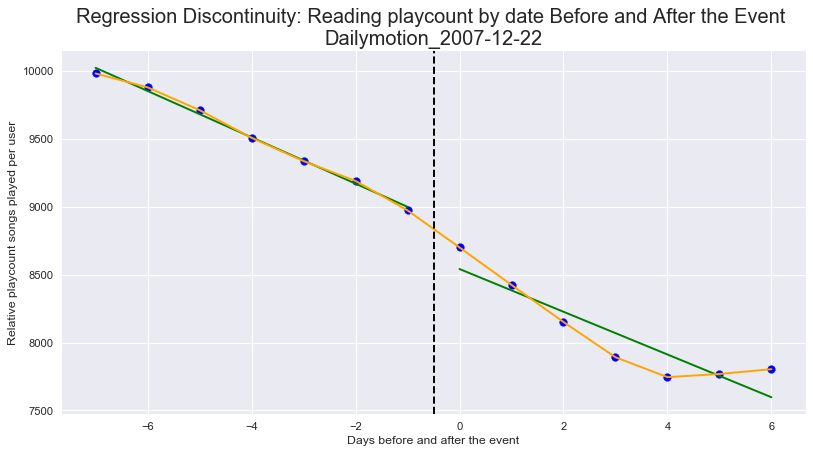


---------------------------------------------------------

R-squared: 0.985219080317

---------------------------------------------------------

Parameters

Intercept                  8566.807143
threshold                  -328.562500
days_to_event              -190.360714
threshold:days_to_event      88.676786
dtype: float64

---------------------------------------------------------

P-values

Intercept                  5.720211e-16
threshold                  2.073377e-02
days_to_event              3.641632e-06
threshold:days_to_event    1.318647e-02
dtype: float64

---------------------------------------------------------



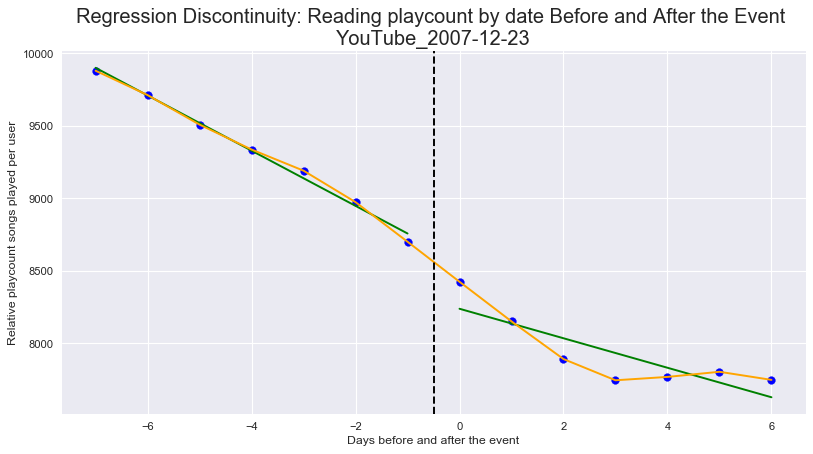


---------------------------------------------------------

R-squared: 0.607202368697

---------------------------------------------------------

Parameters

Intercept                  6429.985714
threshold                   314.310714
days_to_event                -4.362500
threshold:days_to_event     -53.055357
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.941884e-15
threshold                  1.411642e-02
days_to_event              8.177654e-01
threshold:days_to_event    6.929141e-02
dtype: float64

---------------------------------------------------------



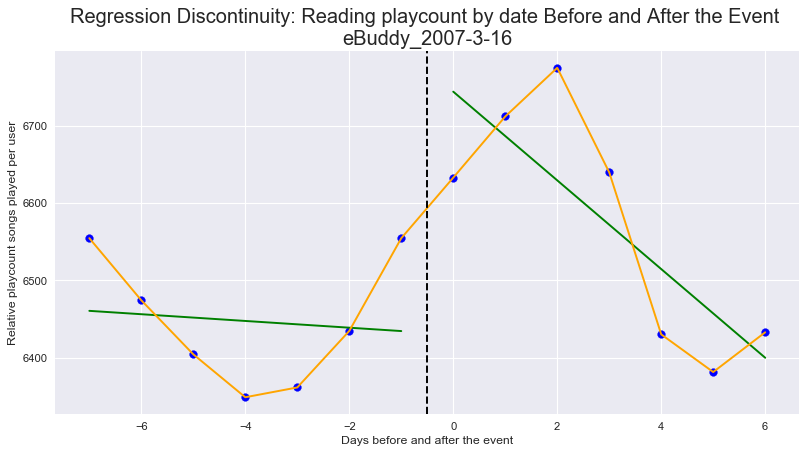


---------------------------------------------------------

R-squared: 0.984395634171

---------------------------------------------------------

Parameters

Intercept                  8828.771429
threshold                  -287.296429
days_to_event              -170.617857
threshold:days_to_event      13.207143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  8.287406e-16
threshold                  4.880972e-02
days_to_event              1.738793e-05
threshold:days_to_event    6.842724e-01
dtype: float64

---------------------------------------------------------



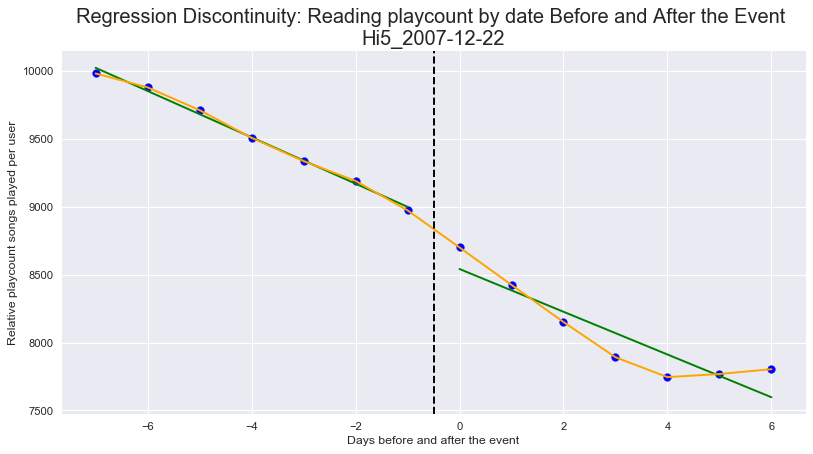


---------------------------------------------------------

R-squared: 0.984395634171

---------------------------------------------------------

Parameters

Intercept                  8828.771429
threshold                  -287.296429
days_to_event              -170.617857
threshold:days_to_event      13.207143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  8.287406e-16
threshold                  4.880972e-02
days_to_event              1.738793e-05
threshold:days_to_event    6.842724e-01
dtype: float64

---------------------------------------------------------



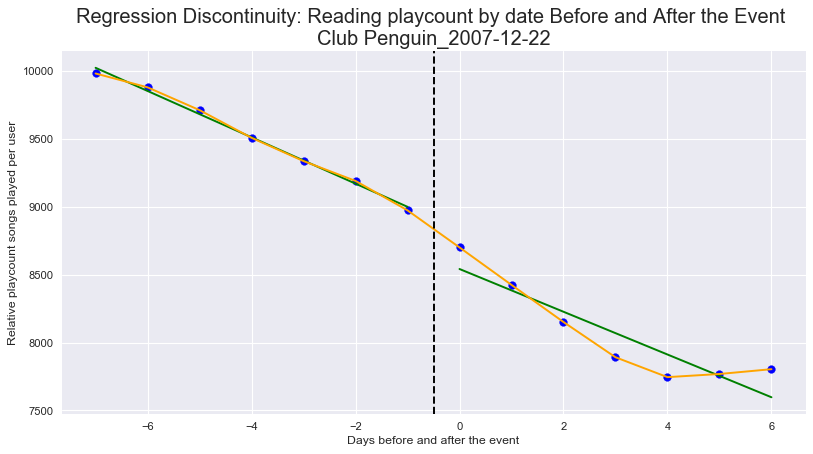


---------------------------------------------------------

R-squared: 0.814477875939

---------------------------------------------------------

Parameters

Intercept                  12002.107143
threshold                    495.564286
days_to_event                -55.341071
threshold:days_to_event       83.562500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.457431e-17
threshold                  2.338175e-03
days_to_event              2.669126e-02
threshold:days_to_event    1.974175e-02
dtype: float64

---------------------------------------------------------



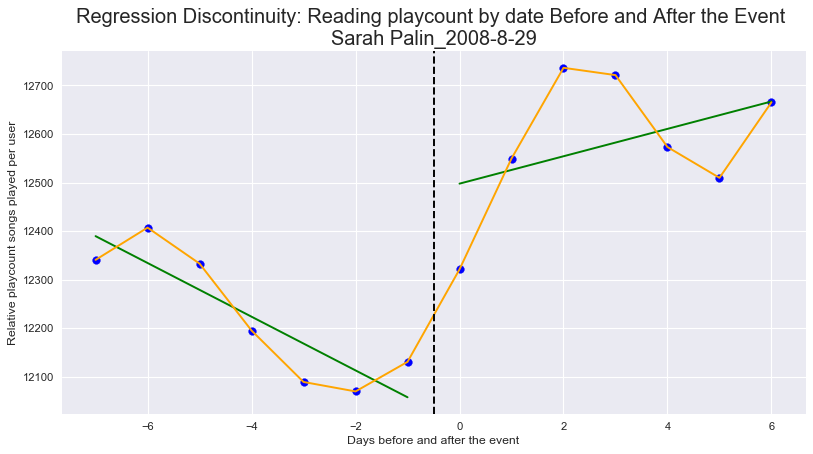


---------------------------------------------------------

R-squared: 0.662383221725

---------------------------------------------------------

Parameters

Intercept                  18342.985714
threshold                    652.800000
days_to_event                -22.441071
threshold:days_to_event     -113.637500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.239843e-17
threshold                  6.859370e-03
days_to_event              5.180874e-01
threshold:days_to_event    3.739840e-02
dtype: float64

---------------------------------------------------------



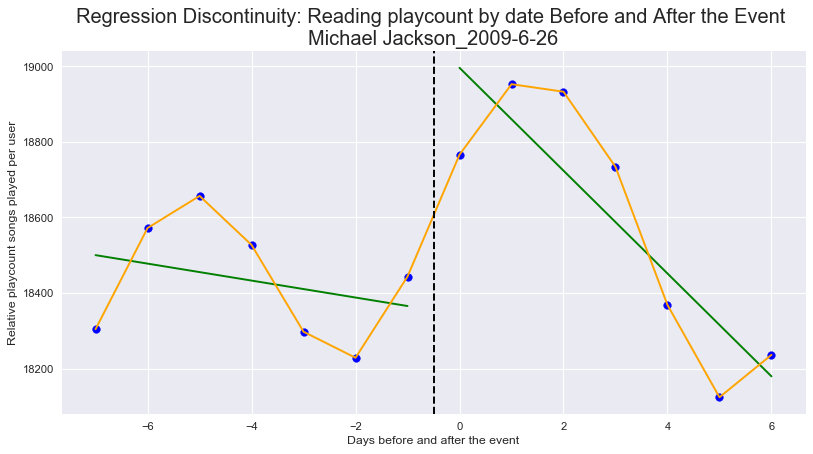


---------------------------------------------------------

R-squared: 0.968170609901

---------------------------------------------------------

Parameters

Intercept                  19606.871429
threshold                   3496.405357
days_to_event               -541.207143
threshold:days_to_event     1344.312500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.941926e-13
threshold                  7.112444e-05
days_to_event              1.831329e-04
threshold:days_to_event    1.433260e-06
dtype: float64

---------------------------------------------------------



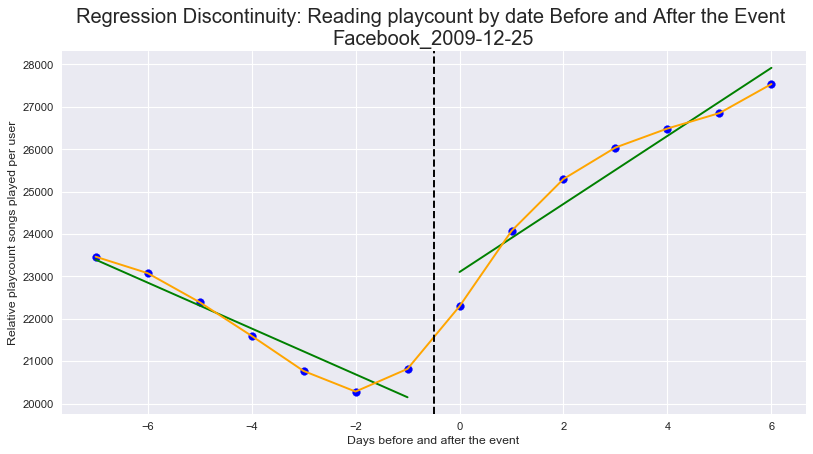


---------------------------------------------------------

R-squared: 0.968170609901

---------------------------------------------------------

Parameters

Intercept                  19606.871429
threshold                   3496.405357
days_to_event               -541.207143
threshold:days_to_event     1344.312500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.941926e-13
threshold                  7.112444e-05
days_to_event              1.831329e-04
threshold:days_to_event    1.433260e-06
dtype: float64

---------------------------------------------------------



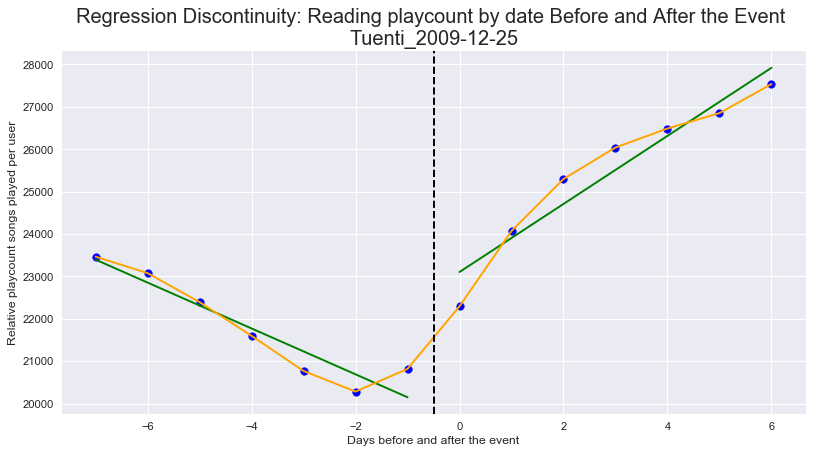


---------------------------------------------------------

R-squared: 0.968170609901

---------------------------------------------------------

Parameters

Intercept                  19606.871429
threshold                   3496.405357
days_to_event               -541.207143
threshold:days_to_event     1344.312500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.941926e-13
threshold                  7.112444e-05
days_to_event              1.831329e-04
threshold:days_to_event    1.433260e-06
dtype: float64

---------------------------------------------------------



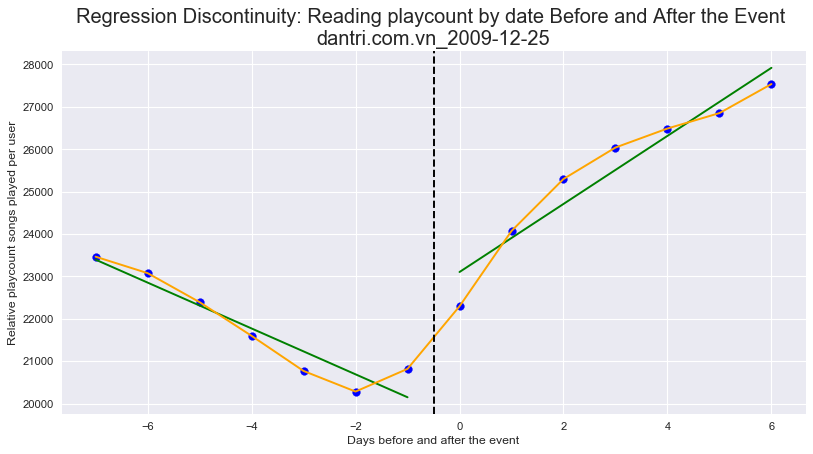


---------------------------------------------------------

R-squared: 0.960150180195

---------------------------------------------------------

Parameters

Intercept                  26014.428571
threshold                   -840.935714
days_to_event                564.514286
threshold:days_to_event     -561.442857
dtype: float64

---------------------------------------------------------

P-values

Intercept                  4.206108e-17
threshold                  1.330158e-02
days_to_event              4.094487e-07
threshold:days_to_event    1.010168e-05
dtype: float64

---------------------------------------------------------



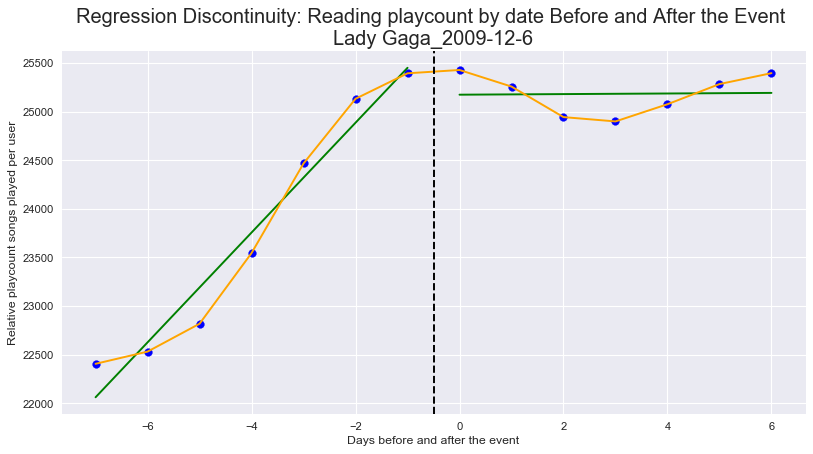


---------------------------------------------------------

R-squared: 0.751886774304

---------------------------------------------------------

Parameters

Intercept                  25777.671429
threshold                    920.616071
days_to_event                -51.694643
threshold:days_to_event      149.853571
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.243881e-15
threshold                  3.975444e-02
days_to_event              4.635343e-01
threshold:days_to_event    1.492678e-01
dtype: float64

---------------------------------------------------------



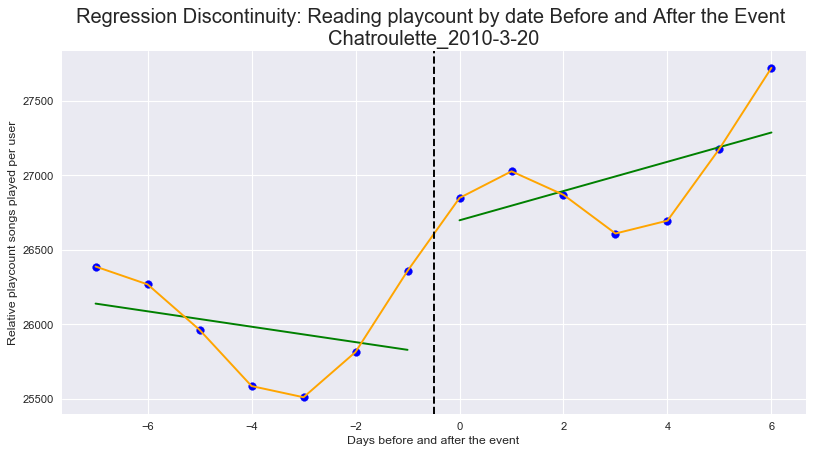


---------------------------------------------------------

R-squared: 0.916352739932

---------------------------------------------------------

Parameters

Intercept                  30291.121429
threshold                   1173.117857
days_to_event               -729.716071
threshold:days_to_event     1216.276786
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.192378e-15
threshold                  3.600015e-02
days_to_event              5.897006e-06
threshold:days_to_event    1.330184e-06
dtype: float64

---------------------------------------------------------



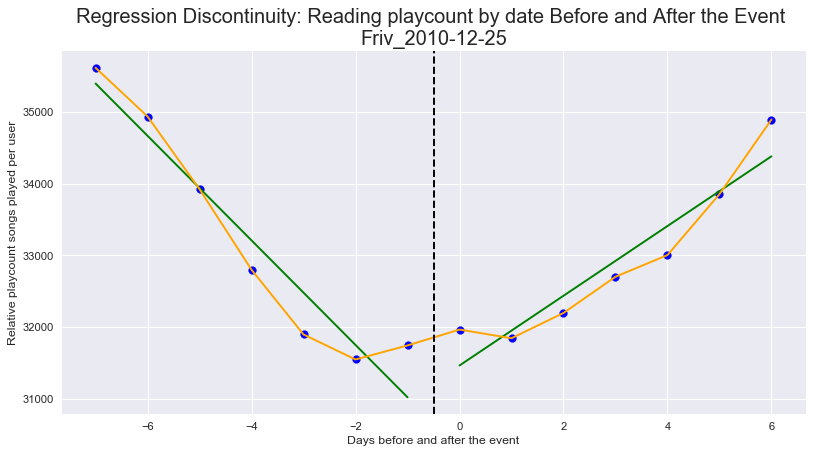


---------------------------------------------------------

R-squared: 0.916352739932

---------------------------------------------------------

Parameters

Intercept                  30291.121429
threshold                   1173.117857
days_to_event               -729.716071
threshold:days_to_event     1216.276786
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.192378e-15
threshold                  3.600015e-02
days_to_event              5.897006e-06
threshold:days_to_event    1.330184e-06
dtype: float64

---------------------------------------------------------



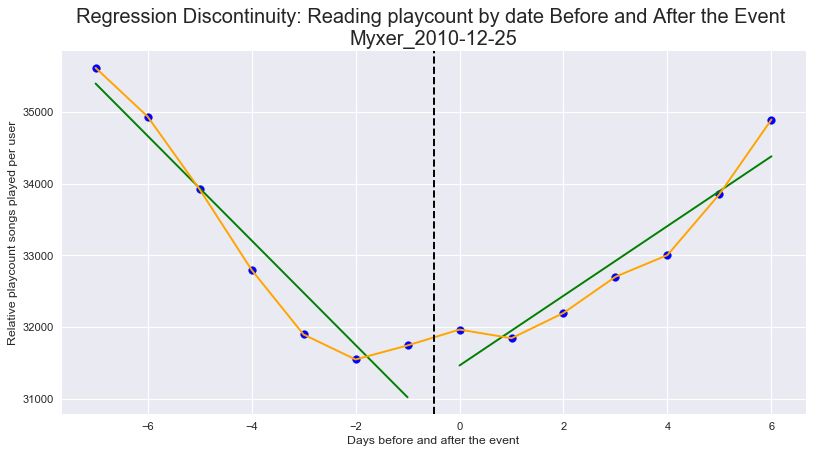


---------------------------------------------------------

R-squared: 0.71482178986

---------------------------------------------------------

Parameters

Intercept                  32251.914286
threshold                   1164.553571
days_to_event               -227.044643
threshold:days_to_event      195.955357
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.541716e-18
threshold                  1.573717e-03
days_to_event              7.124988e-04
threshold:days_to_event    1.489587e-02
dtype: float64

---------------------------------------------------------



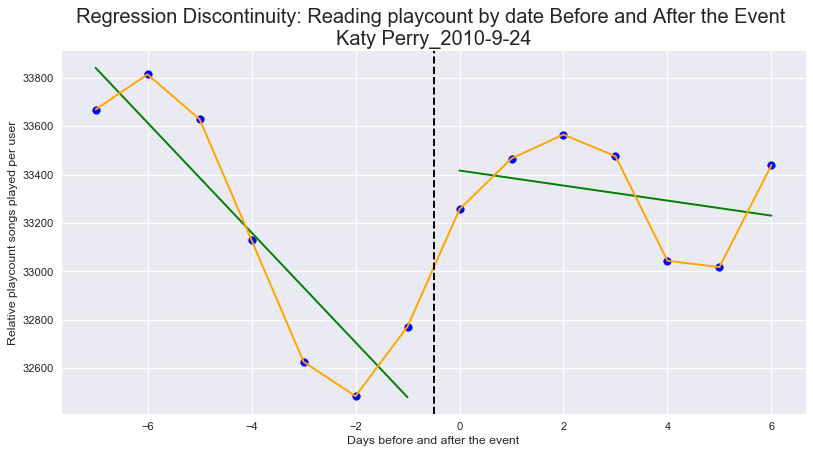


---------------------------------------------------------

R-squared: 0.844933163977

---------------------------------------------------------

Parameters

Intercept                  25425.978571
threshold                   1186.092857
days_to_event               -136.785714
threshold:days_to_event      198.807143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.092039e-17
threshold                  9.143228e-04
days_to_event              1.168876e-02
threshold:days_to_event    1.010883e-02
dtype: float64

---------------------------------------------------------



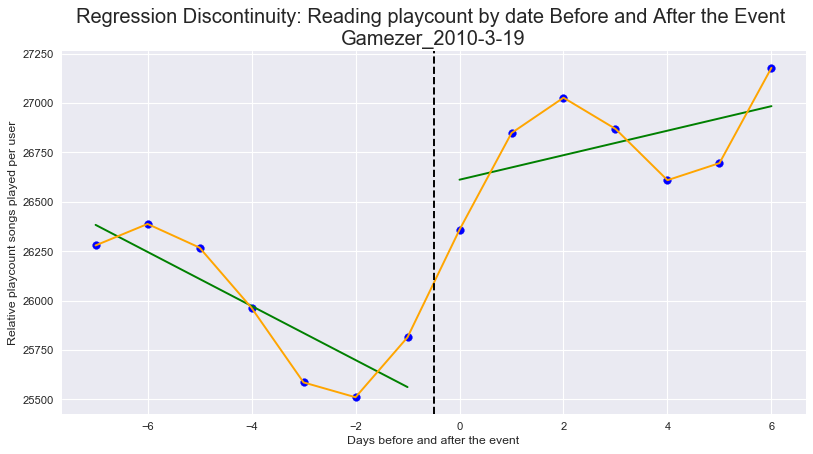


---------------------------------------------------------

R-squared: 0.916352739932

---------------------------------------------------------

Parameters

Intercept                  30291.121429
threshold                   1173.117857
days_to_event               -729.716071
threshold:days_to_event     1216.276786
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.192378e-15
threshold                  3.600015e-02
days_to_event              5.897006e-06
threshold:days_to_event    1.330184e-06
dtype: float64

---------------------------------------------------------



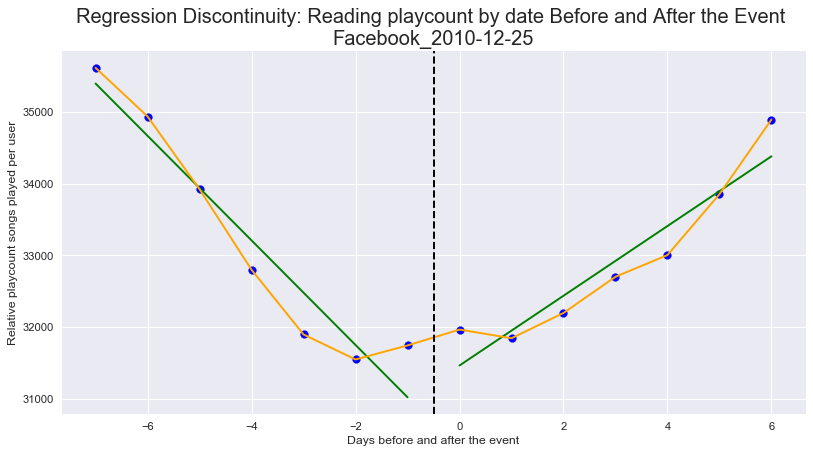


---------------------------------------------------------

R-squared: 0.813175732657

---------------------------------------------------------

Parameters

Intercept                  30936.628571
threshold                   1100.692857
days_to_event               -407.492857
threshold:days_to_event      513.921429
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.279273e-16
threshold                  1.438860e-02
days_to_event              9.066807e-05
threshold:days_to_event    2.257607e-04
dtype: float64

---------------------------------------------------------



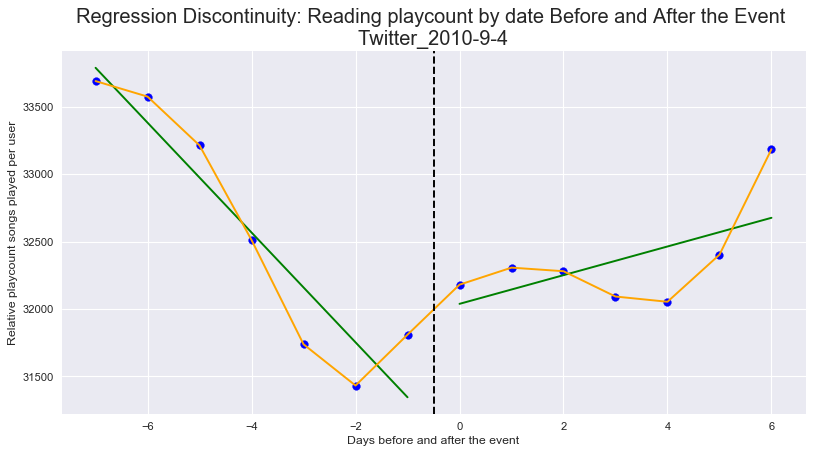


---------------------------------------------------------

R-squared: 0.775147897864

---------------------------------------------------------

Parameters

Intercept                  40150.492857
threshold                   1350.416071
days_to_event               -104.082143
threshold:days_to_event      147.541071
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.298476e-17
threshold                  5.602559e-03
days_to_event              1.508921e-01
threshold:days_to_event    1.500284e-01
dtype: float64

---------------------------------------------------------



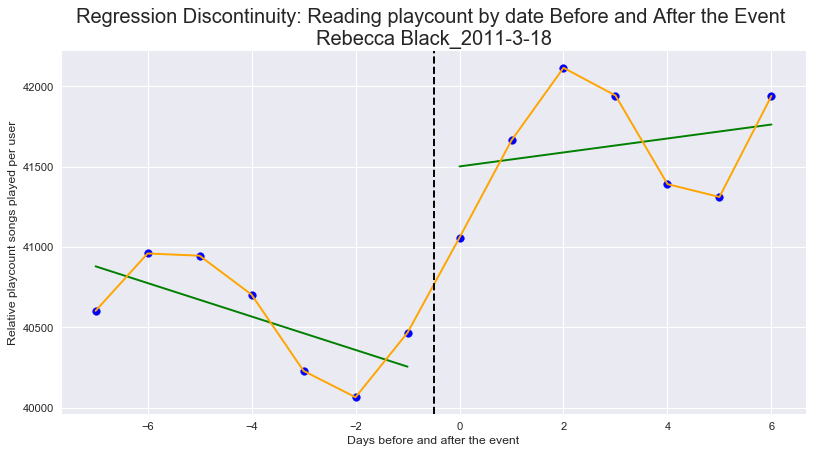


---------------------------------------------------------

R-squared: 0.800287518559

---------------------------------------------------------

Parameters

Intercept                  44181.457143
threshold                  -1652.664286
days_to_event                447.200000
threshold:days_to_event     -212.535714
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.276897e-16
threshold                  1.109281e-02
days_to_event              6.900579e-04
threshold:days_to_event    1.354986e-01
dtype: float64

---------------------------------------------------------



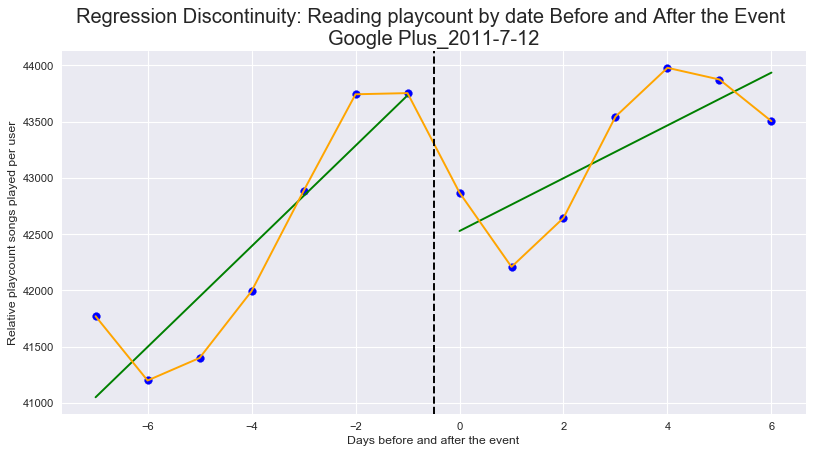


---------------------------------------------------------

R-squared: 0.670255870905

---------------------------------------------------------

Parameters

Intercept                  44773.100000
threshold                  -1177.289286
days_to_event                266.769643
threshold:days_to_event      -36.708929
dtype: float64

---------------------------------------------------------

P-values

Intercept                  8.841123e-17
threshold                  4.682120e-02
days_to_event              1.451621e-02
threshold:days_to_event    7.798877e-01
dtype: float64

---------------------------------------------------------



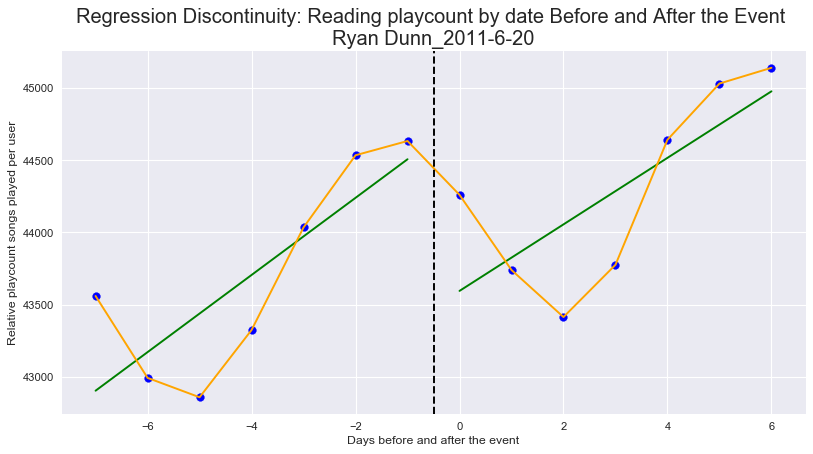


---------------------------------------------------------

R-squared: 0.858152846109

---------------------------------------------------------

Parameters

Intercept                  42385.957143
threshold                  -1334.900000
days_to_event               -243.730357
threshold:days_to_event      690.930357
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.919069e-17
threshold                  1.465047e-02
days_to_event              1.145812e-02
threshold:days_to_event    1.024531e-04
dtype: float64

---------------------------------------------------------



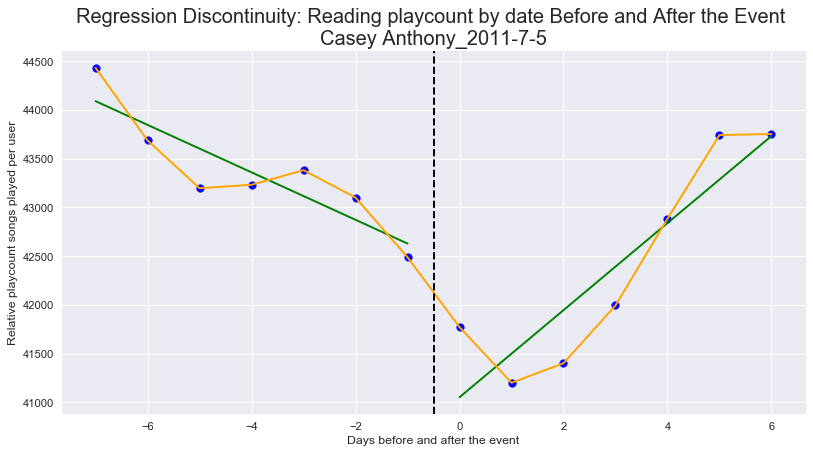


---------------------------------------------------------

R-squared: 0.750784160136

---------------------------------------------------------

Parameters

Intercept                  52824.957143
threshold                  -2066.885714
days_to_event                392.991071
threshold:days_to_event       60.173214
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.569729e-16
threshold                  1.495416e-02
days_to_event              9.427734e-03
threshold:days_to_event    7.358606e-01
dtype: float64

---------------------------------------------------------



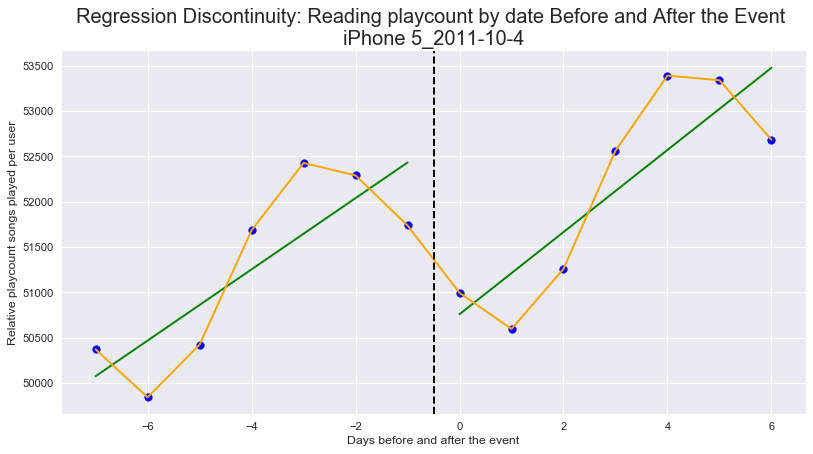


---------------------------------------------------------

R-squared: 0.811520677833

---------------------------------------------------------

Parameters

Intercept                  104458.557143
threshold                   -5131.371429
days_to_event                 324.157143
threshold:days_to_event      -272.635714
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.490952e-17
threshold                  1.403665e-03
days_to_event              1.440294e-01
threshold:days_to_event    3.680597e-01
dtype: float64

---------------------------------------------------------



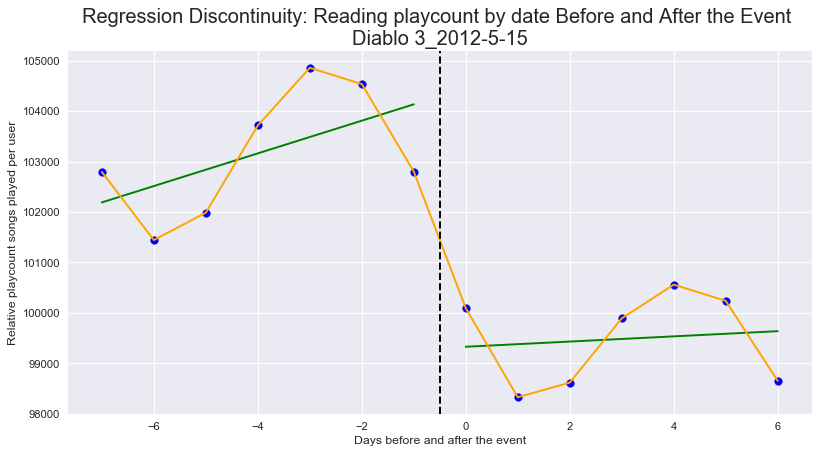


---------------------------------------------------------

R-squared: 0.463876712967

---------------------------------------------------------

Parameters

Intercept                  65597.000000
threshold                   2813.671429
days_to_event               -343.478571
threshold:days_to_event      -51.485714
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.952877e-15
threshold                  2.183527e-02
days_to_event              8.629895e-02
threshold:days_to_event    8.442524e-01
dtype: float64

---------------------------------------------------------



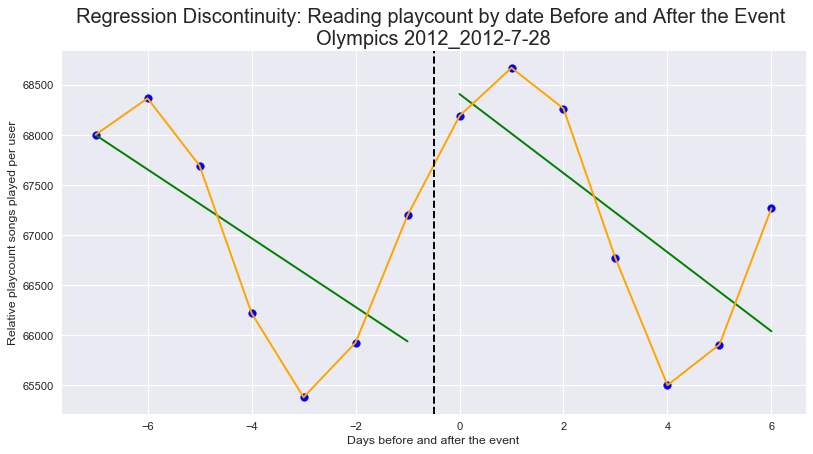


---------------------------------------------------------

R-squared: 0.452707782527

---------------------------------------------------------

Parameters

Intercept                  69598.385714
threshold                   2728.776786
days_to_event               -473.762500
threshold:days_to_event      428.182143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.481595e-15
threshold                  2.891089e-02
days_to_event              2.924711e-02
threshold:days_to_event    1.352822e-01
dtype: float64

---------------------------------------------------------



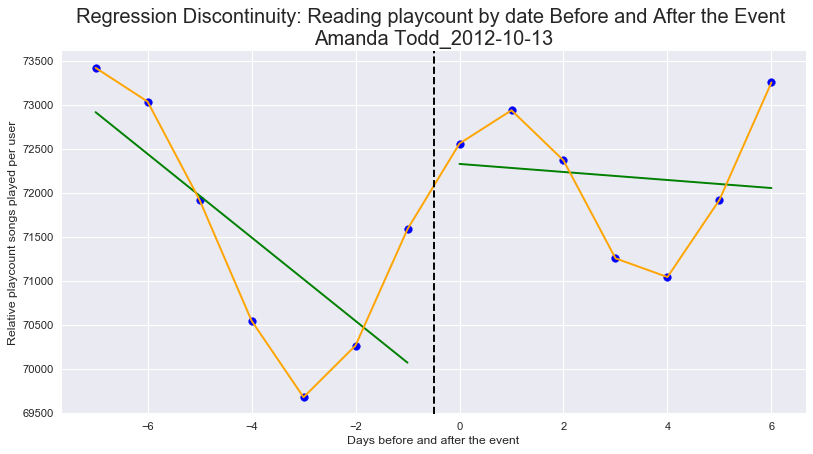


---------------------------------------------------------

R-squared: 0.789270454844

---------------------------------------------------------

Parameters

Intercept                  69315.207143
threshold                  -2704.042857
days_to_event                170.451786
threshold:days_to_event      741.833929
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.815068e-16
threshold                  1.345771e-02
days_to_event              3.035807e-01
threshold:days_to_event    7.520823e-03
dtype: float64

---------------------------------------------------------



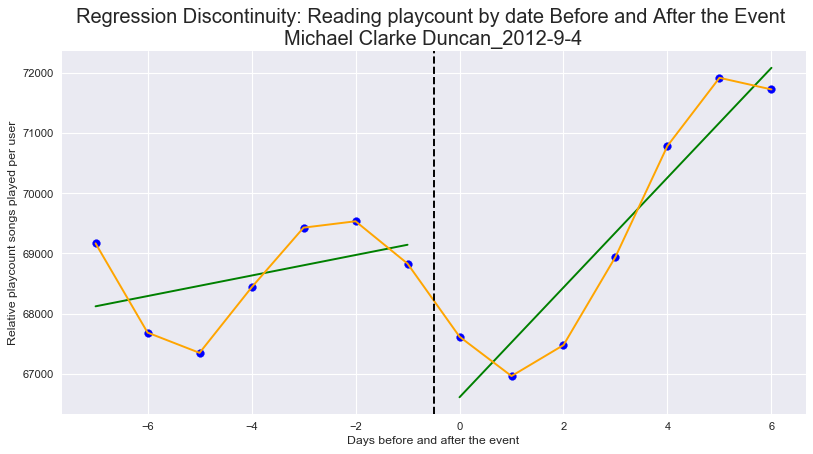


---------------------------------------------------------

R-squared: 0.957832567335

---------------------------------------------------------

Parameters

Intercept                  65208.500000
threshold                  -2075.317857
days_to_event                809.344643
threshold:days_to_event      -86.162500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.038566e-17
threshold                  6.778159e-03
days_to_event              1.807628e-05
threshold:days_to_event    5.791108e-01
dtype: float64

---------------------------------------------------------



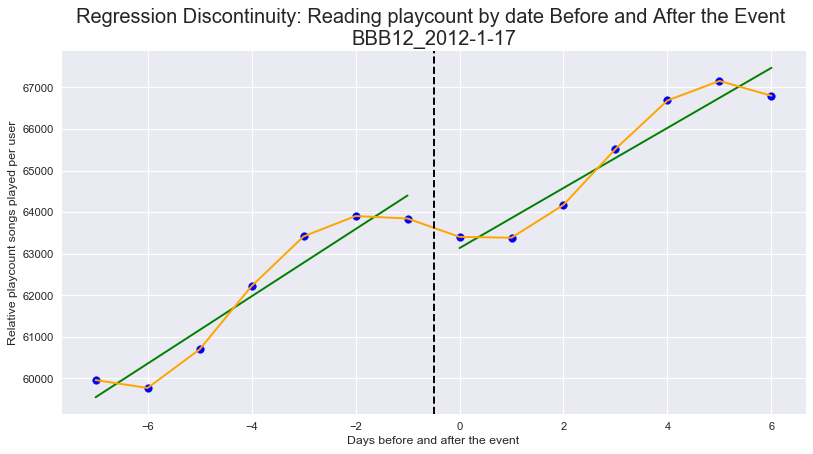


---------------------------------------------------------

R-squared: 0.755711340933

---------------------------------------------------------

Parameters

Intercept                  74614.678571
threshold                  -3195.105357
days_to_event                487.605357
threshold:days_to_event     -514.039286
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.039917e-17
threshold                  1.021177e-03
days_to_event              2.481033e-03
threshold:days_to_event    1.360479e-02
dtype: float64

---------------------------------------------------------



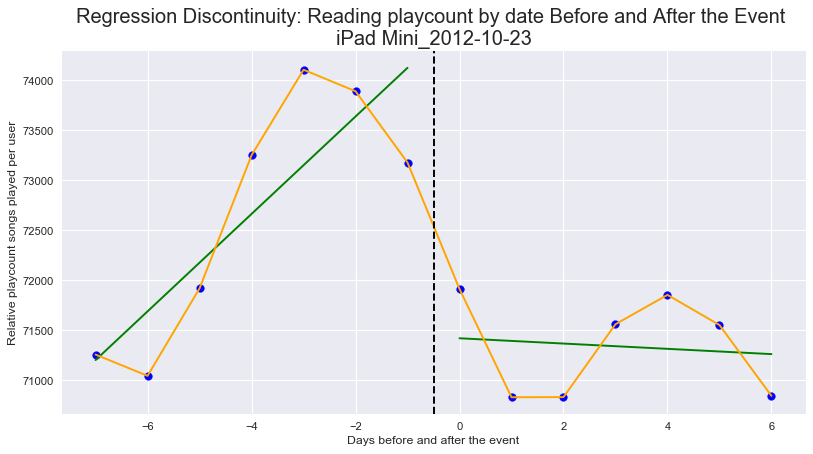


---------------------------------------------------------

R-squared: 0.741472460844

---------------------------------------------------------

Parameters

Intercept                  63758.314286
threshold                  -2246.835714
days_to_event               -107.710714
threshold:days_to_event      480.925000
dtype: float64

---------------------------------------------------------

P-values

Intercept                  7.050554e-17
threshold                  1.110596e-02
days_to_event              4.121472e-01
threshold:days_to_event    2.223978e-02
dtype: float64

---------------------------------------------------------



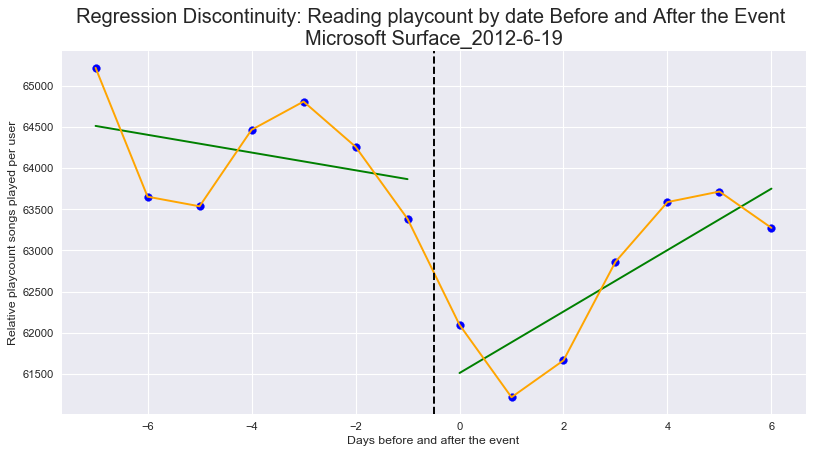


---------------------------------------------------------

R-squared: 0.908663756624

---------------------------------------------------------

Parameters

Intercept                  64234.828571
threshold                   2034.987500
days_to_event                189.433929
threshold:days_to_event     -126.925000
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.355730e-17
threshold                  8.084053e-03
days_to_event              1.085674e-01
threshold:days_to_event    4.233506e-01
dtype: float64

---------------------------------------------------------



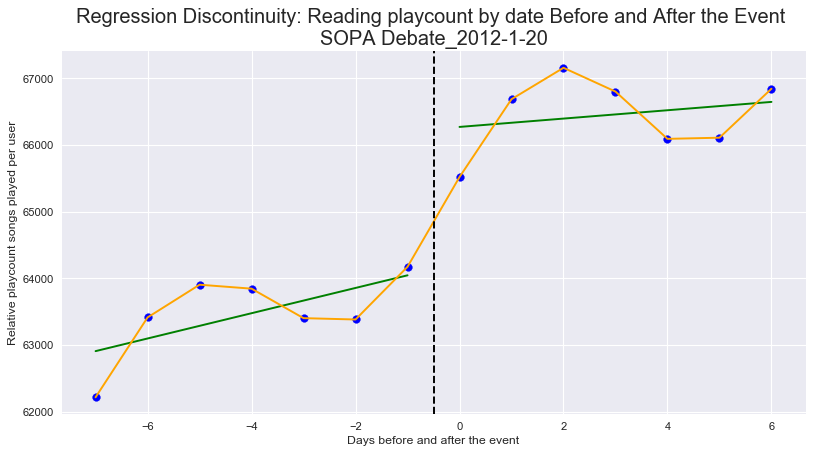


---------------------------------------------------------

R-squared: 0.88165887924

---------------------------------------------------------

Parameters

Intercept                  80253.292857
threshold                  -2535.107143
days_to_event                728.467857
threshold:days_to_event      -34.467857
dtype: float64

---------------------------------------------------------

P-values

Intercept                  5.348613e-17
threshold                  1.684909e-02
days_to_event              8.076207e-04
threshold:days_to_event    8.774806e-01
dtype: float64

---------------------------------------------------------



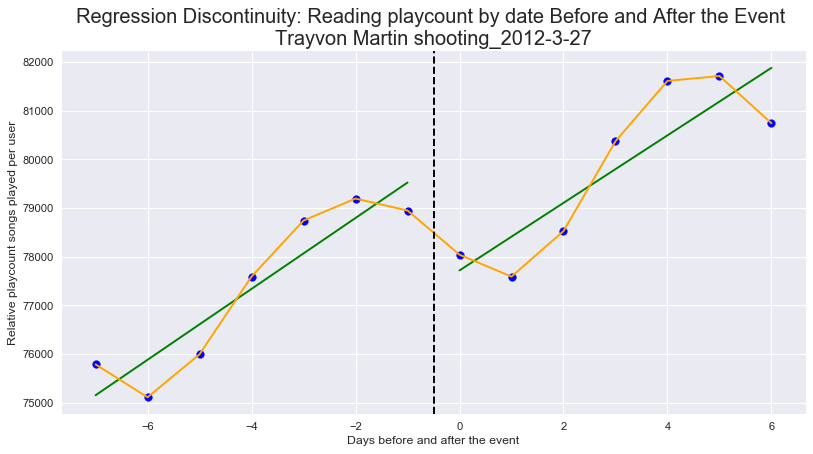


---------------------------------------------------------

R-squared: 0.552156788408

---------------------------------------------------------

Parameters

Intercept                  65540.185714
threshold                   2634.703571
days_to_event               -329.078571
threshold:days_to_event      204.710714
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.362287e-16
threshold                  7.762431e-03
days_to_event              3.852712e-02
threshold:days_to_event    3.195425e-01
dtype: float64

---------------------------------------------------------



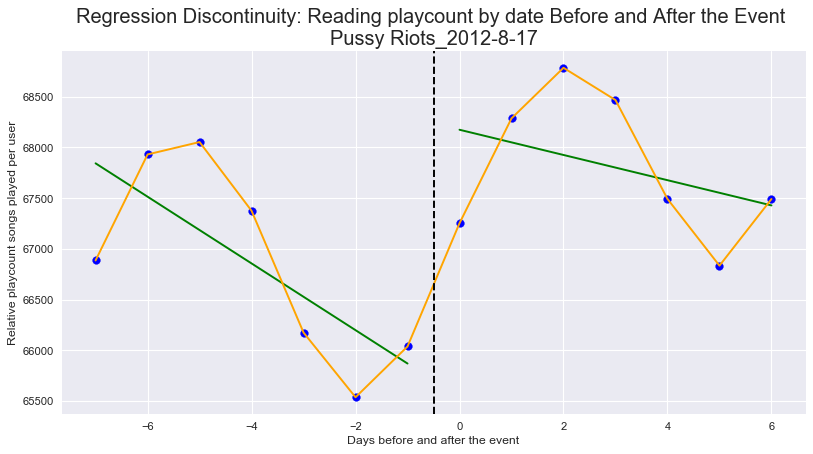


---------------------------------------------------------

R-squared: 0.693449901953

---------------------------------------------------------

Parameters

Intercept                  68029.828571
threshold                   2224.210714
days_to_event               -518.050000
threshold:days_to_event      173.896429
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.651219e-16
threshold                  2.440628e-02
days_to_event              5.332803e-03
threshold:days_to_event    4.200641e-01
dtype: float64

---------------------------------------------------------



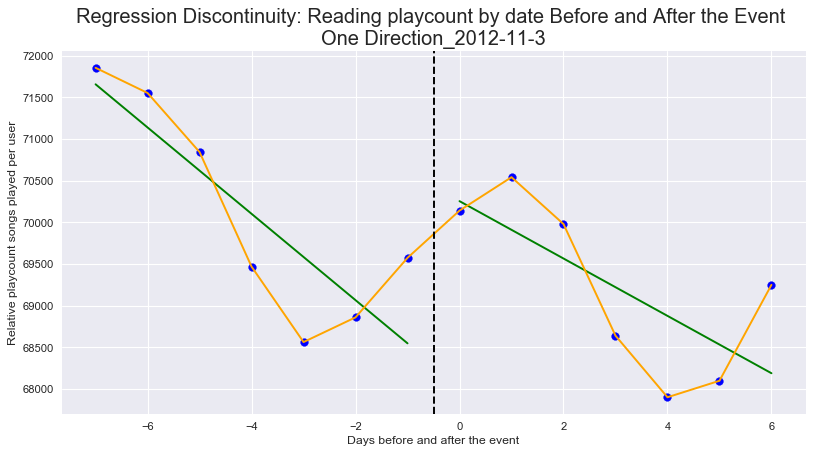


---------------------------------------------------------

R-squared: 0.815212019936

---------------------------------------------------------

Parameters

Intercept                  106575.957143
threshold                   -3725.580357
days_to_event                1458.076786
threshold:days_to_event     -1258.614286
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.875733e-16
threshold                  3.400706e-02
days_to_event              2.553219e-04
threshold:days_to_event    7.145912e-03
dtype: float64

---------------------------------------------------------



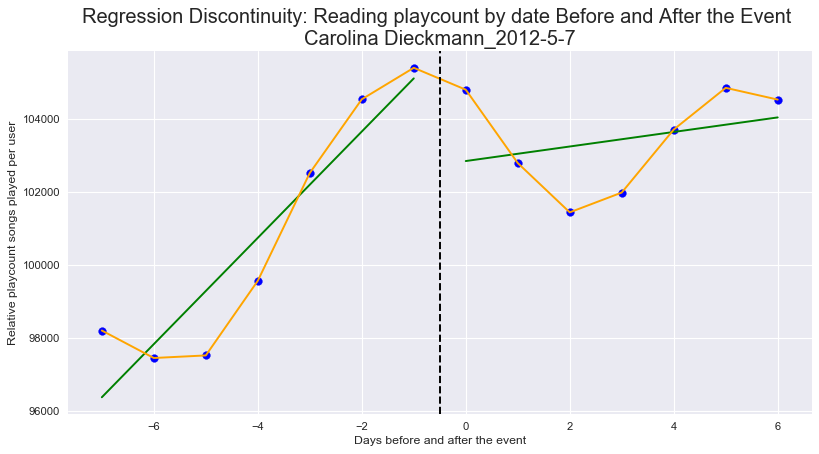


---------------------------------------------------------

R-squared: 0.792556965437

---------------------------------------------------------

Parameters

Intercept                  67337.528571
threshold                   3792.133929
days_to_event               -265.608929
threshold:days_to_event      290.007143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.502692e-16
threshold                  2.617946e-03
days_to_event              1.407314e-01
threshold:days_to_event    2.450166e-01
dtype: float64

---------------------------------------------------------



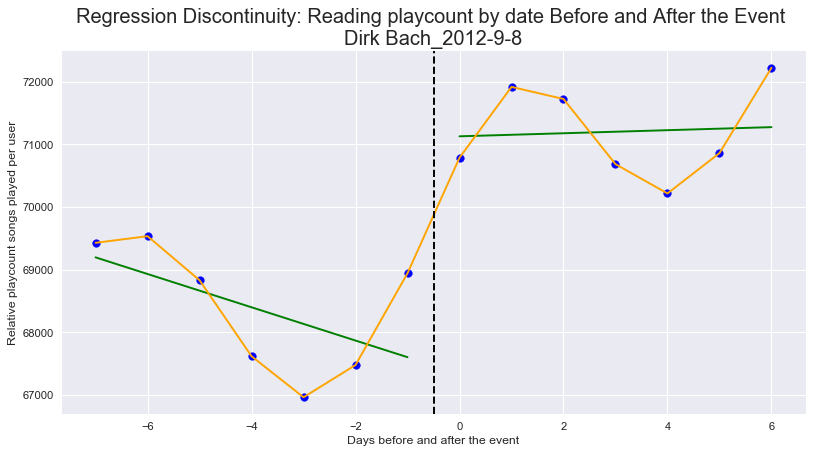


---------------------------------------------------------

R-squared: 0.679266418413

---------------------------------------------------------

Parameters

Intercept                  67153.507143
threshold                   1640.410714
days_to_event                 87.492857
threshold:days_to_event     -237.396429
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.684372e-17
threshold                  4.435346e-02
days_to_event              4.973207e-01
threshold:days_to_event    2.063850e-01
dtype: float64

---------------------------------------------------------



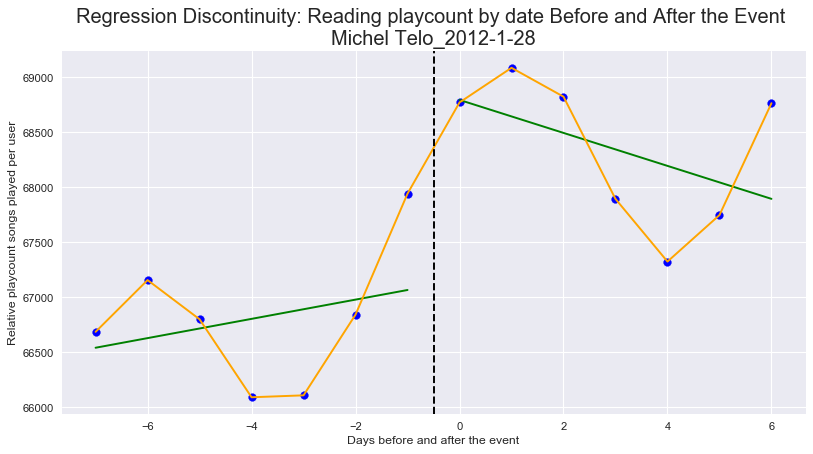


---------------------------------------------------------

R-squared: 0.907406787678

---------------------------------------------------------

Parameters

Intercept                  61508.528571
threshold                   1755.628571
days_to_event                255.730357
threshold:days_to_event      -27.537500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.236225e-16
threshold                  3.864668e-02
days_to_event              7.448653e-02
threshold:days_to_event    8.825127e-01
dtype: float64

---------------------------------------------------------



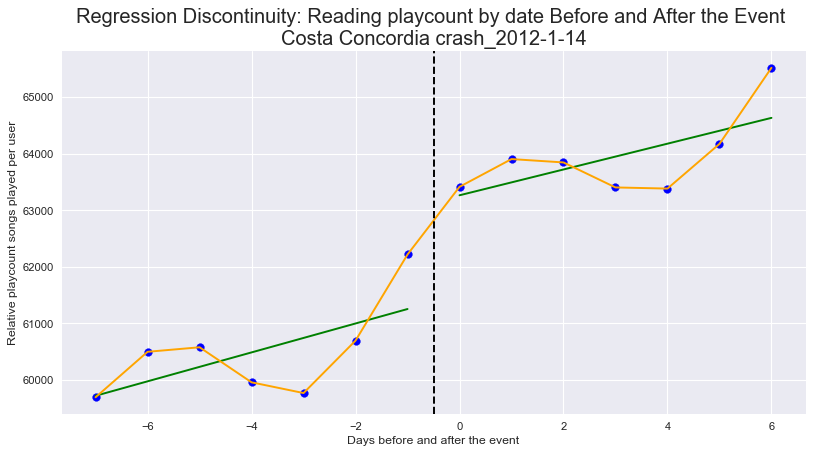


---------------------------------------------------------

R-squared: 0.872493226342

---------------------------------------------------------

Parameters

Intercept                  65978.050000
threshold                   4359.587500
days_to_event                125.775000
threshold:days_to_event     -323.958929
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.300614e-15
threshold                  2.108115e-03
days_to_event              5.111638e-01
threshold:days_to_event    2.429972e-01
dtype: float64

---------------------------------------------------------



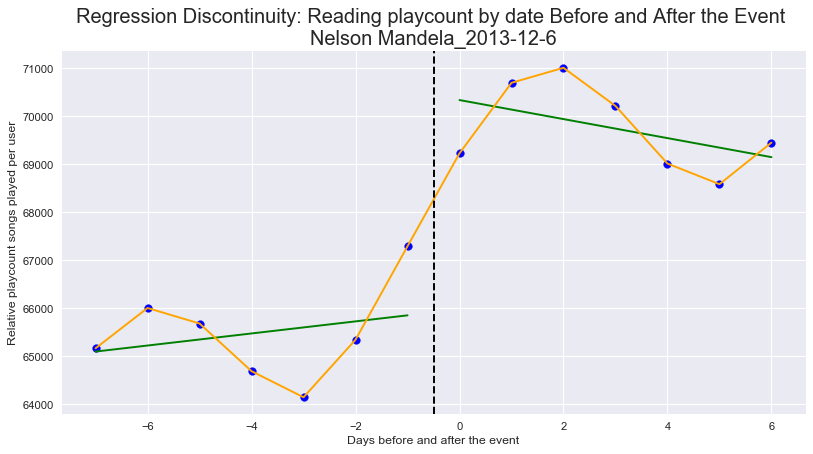


---------------------------------------------------------

R-squared: 0.860117026258

---------------------------------------------------------

Parameters

Intercept                  70115.778571
threshold                  -3192.982143
days_to_event                983.837500
threshold:days_to_event     -630.662500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.346774e-16
threshold                  5.177401e-03
days_to_event              8.883749e-05
threshold:days_to_event    1.705650e-02
dtype: float64

---------------------------------------------------------



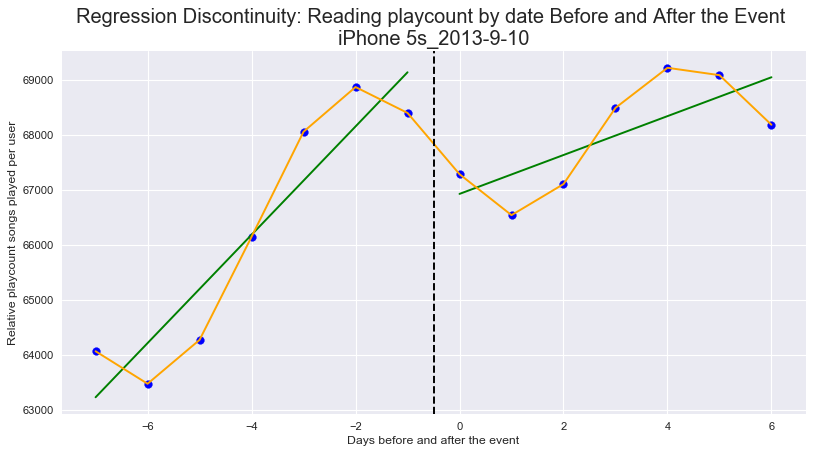


---------------------------------------------------------

R-squared: 0.429185943543

---------------------------------------------------------

Parameters

Intercept                  65981.857143
threshold                   2363.992857
days_to_event               -181.414286
threshold:days_to_event     -190.021429
dtype: float64

---------------------------------------------------------

P-values

Intercept                  7.579810e-16
threshold                  3.193522e-02
days_to_event              2.978809e-01
threshold:days_to_event    4.349601e-01
dtype: float64

---------------------------------------------------------



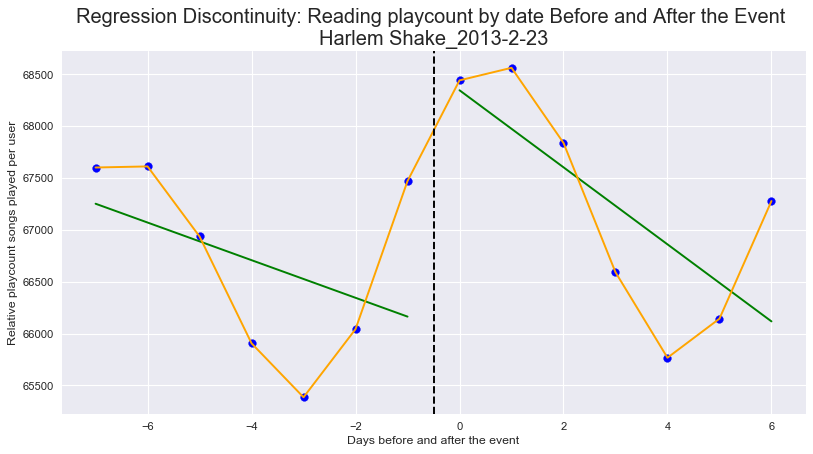


---------------------------------------------------------

R-squared: 0.713160265974

---------------------------------------------------------

Parameters

Intercept                  64223.650000
threshold                   2862.832143
days_to_event               -514.828571
threshold:days_to_event      100.639286
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.434994e-16
threshold                  4.381497e-03
days_to_event              3.589783e-03
threshold:days_to_event    6.125127e-01
dtype: float64

---------------------------------------------------------



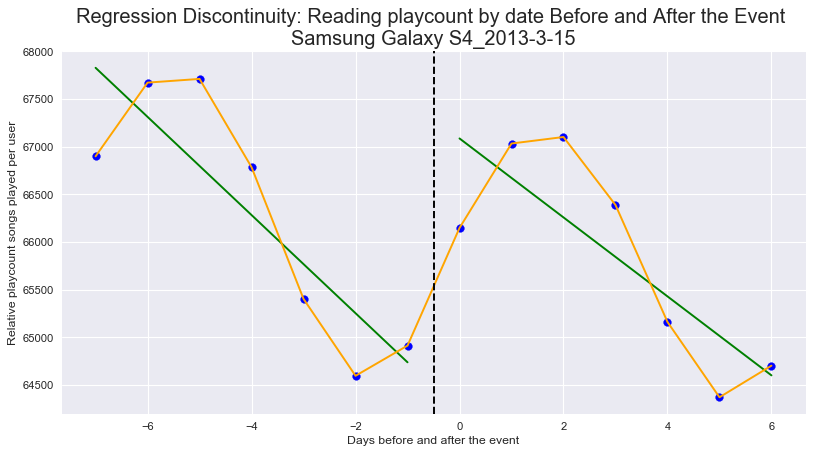


---------------------------------------------------------

R-squared: 0.500721871036

---------------------------------------------------------

Parameters

Intercept                  63027.092857
threshold                   2576.471429
days_to_event               -508.119643
threshold:days_to_event      520.962500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.918027e-15
threshold                  2.695532e-02
days_to_event              1.493505e-02
threshold:days_to_event    5.930268e-02
dtype: float64

---------------------------------------------------------



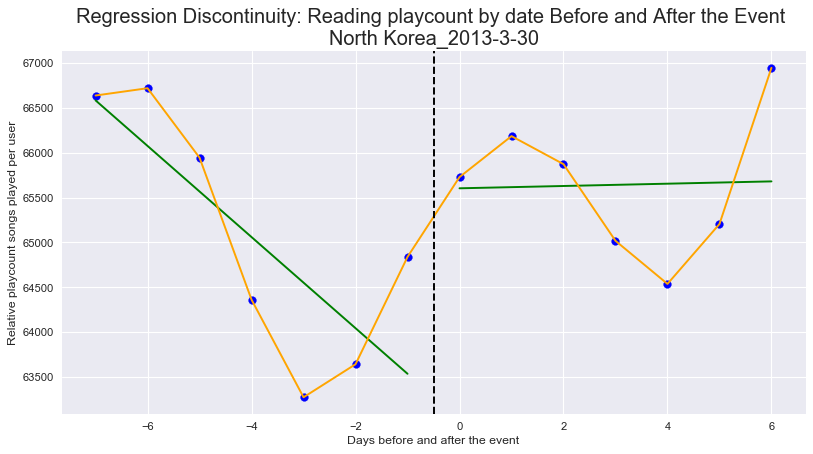


---------------------------------------------------------

R-squared: 0.748758038184

---------------------------------------------------------

Parameters

Intercept                  67700.557143
threshold                   3588.282143
days_to_event               -404.789286
threshold:days_to_event       -9.157143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.719445e-17
threshold                  3.088701e-04
days_to_event              5.840192e-03
threshold:days_to_event    9.566015e-01
dtype: float64

---------------------------------------------------------



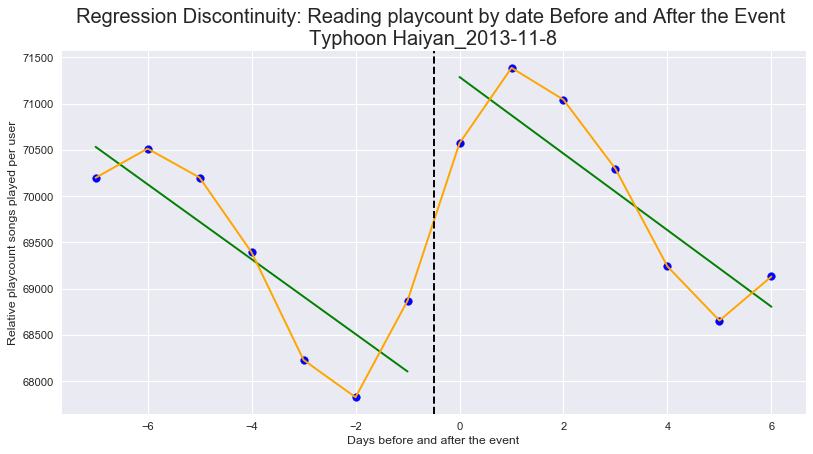


---------------------------------------------------------

R-squared: 0.872493226342

---------------------------------------------------------

Parameters

Intercept                  65978.050000
threshold                   4359.587500
days_to_event                125.775000
threshold:days_to_event     -323.958929
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.300614e-15
threshold                  2.108115e-03
days_to_event              5.111638e-01
threshold:days_to_event    2.429972e-01
dtype: float64

---------------------------------------------------------



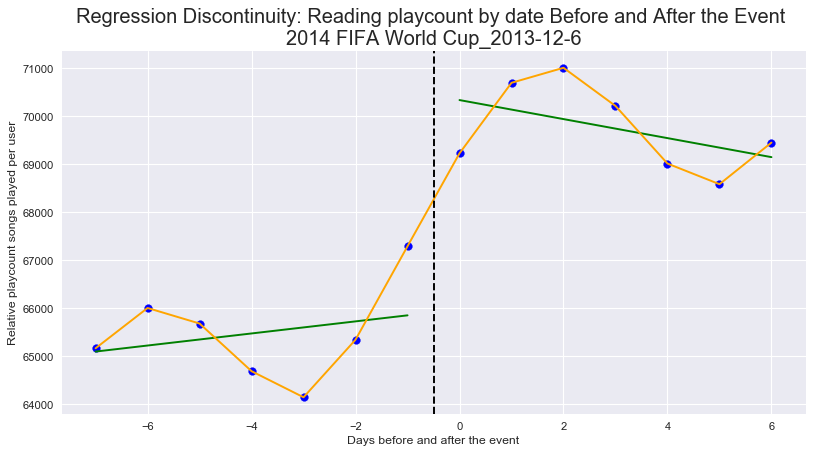


---------------------------------------------------------

R-squared: 0.706401190996

---------------------------------------------------------

Parameters

Intercept                  62685.935714
threshold                   3460.566071
days_to_event               -763.633929
threshold:days_to_event      256.157143
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.014328e-14
threshold                  1.428538e-02
days_to_event              3.769240e-03
threshold:days_to_event    3.943527e-01
dtype: float64

---------------------------------------------------------



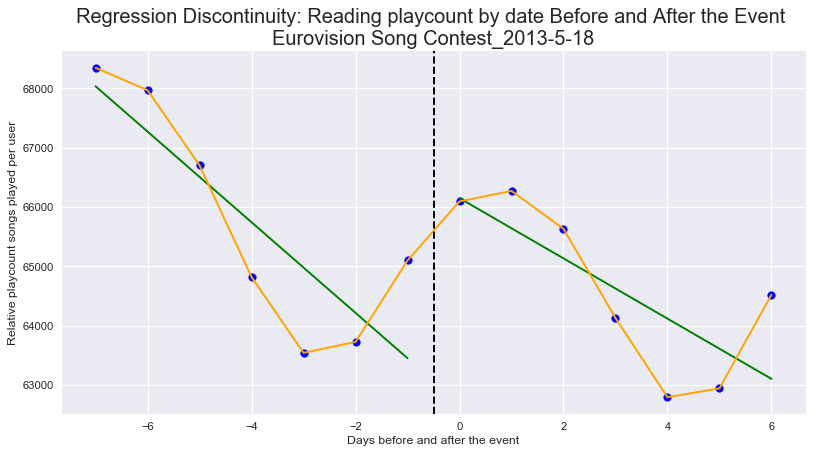


---------------------------------------------------------

R-squared: 0.653097988167

---------------------------------------------------------

Parameters

Intercept                  62551.185714
threshold                   2654.289286
days_to_event               -647.148214
threshold:days_to_event      457.394643
dtype: float64

---------------------------------------------------------

P-values

Intercept                  9.836566e-16
threshold                  1.654606e-02
days_to_event              2.416003e-03
threshold:days_to_event    7.193958e-02
dtype: float64

---------------------------------------------------------



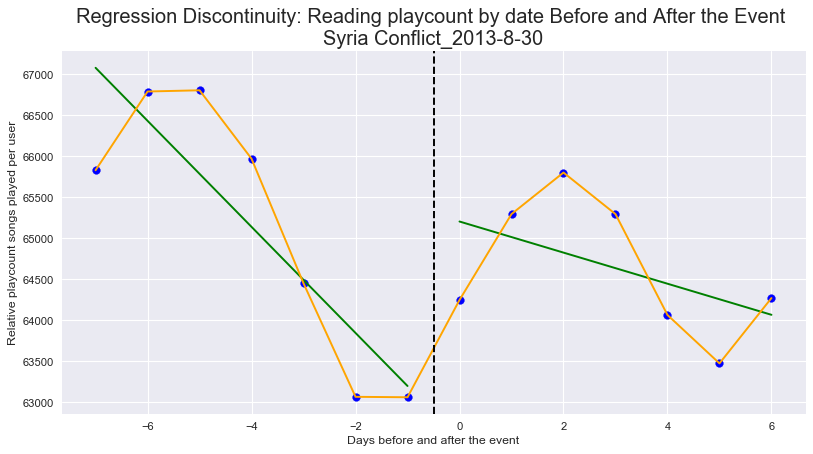


---------------------------------------------------------

R-squared: 0.628341084308

---------------------------------------------------------

Parameters

Intercept                  62534.064286
threshold                   3213.289286
days_to_event               -543.123214
threshold:days_to_event       88.198214
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.243979e-15
threshold                  9.416069e-03
days_to_event              1.102908e-02
threshold:days_to_event    7.282877e-01
dtype: float64

---------------------------------------------------------



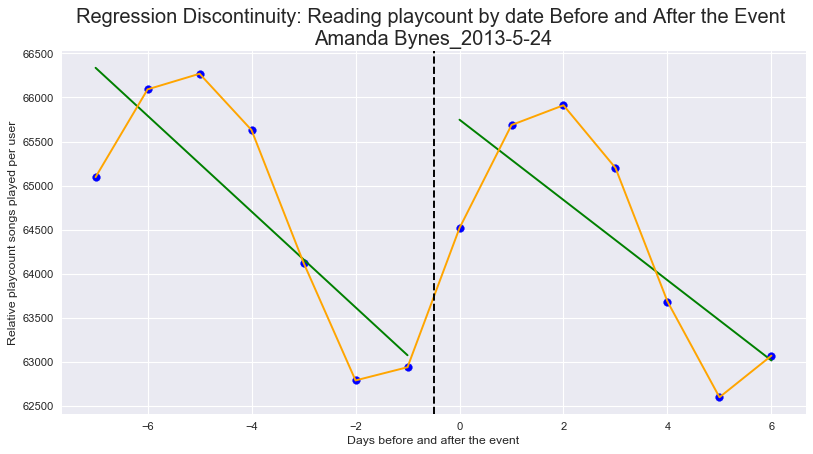


---------------------------------------------------------

R-squared: 0.848709544618

---------------------------------------------------------

Parameters

Intercept                  65923.842857
threshold                  -2694.926786
days_to_event                365.942857
threshold:days_to_event      617.894643
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.279652e-16
threshold                  1.593513e-02
days_to_event              4.742981e-02
threshold:days_to_event    2.241249e-02
dtype: float64

---------------------------------------------------------



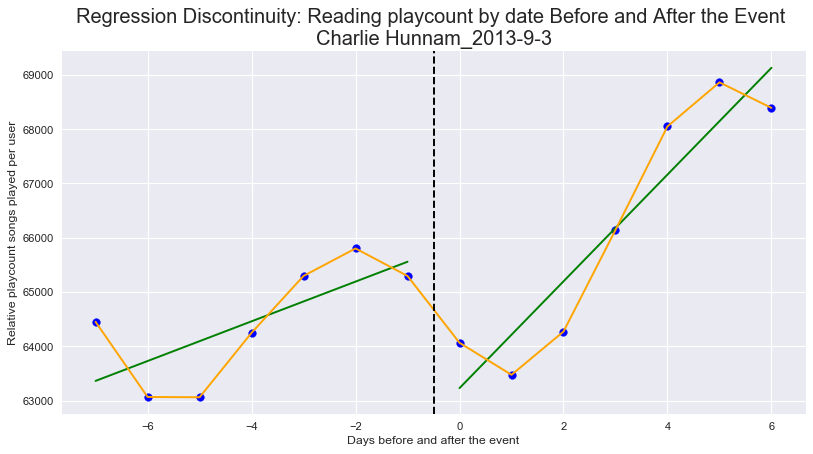


---------------------------------------------------------

R-squared: 0.761112788851

---------------------------------------------------------

Parameters

Intercept                  67740.200000
threshold                  -3815.919643
days_to_event                124.357143
threshold:days_to_event      242.173214
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.079186e-16
threshold                  1.595815e-03
days_to_event              4.409673e-01
threshold:days_to_event    2.950621e-01
dtype: float64

---------------------------------------------------------



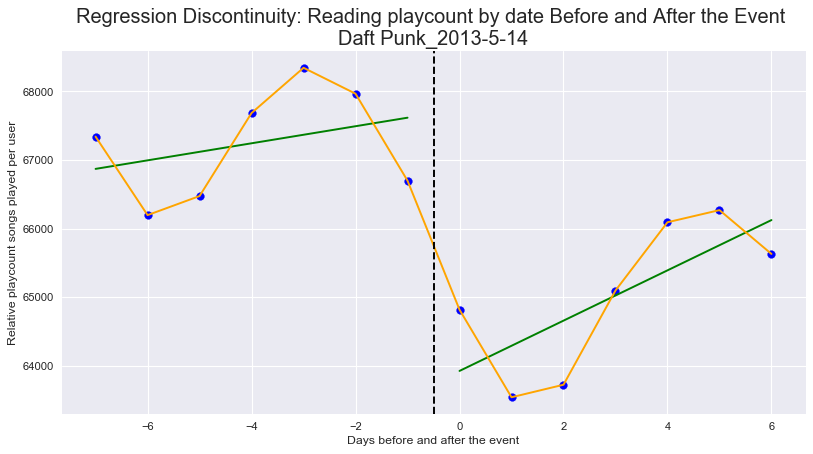


---------------------------------------------------------

R-squared: 0.848709544618

---------------------------------------------------------

Parameters

Intercept                  65923.842857
threshold                  -2694.926786
days_to_event                365.942857
threshold:days_to_event      617.894643
dtype: float64

---------------------------------------------------------

P-values

Intercept                  6.279652e-16
threshold                  1.593513e-02
days_to_event              4.742981e-02
threshold:days_to_event    2.241249e-02
dtype: float64

---------------------------------------------------------



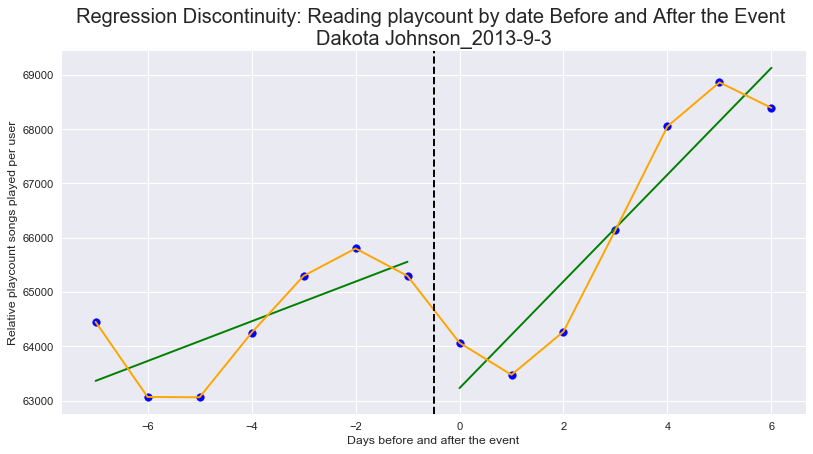


---------------------------------------------------------

R-squared: 0.712201803045

---------------------------------------------------------

Parameters

Intercept                  72747.350000
threshold                  -3093.957143
days_to_event                559.153571
threshold:days_to_event     -327.275000
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.407872e-17
threshold                  1.321552e-03
days_to_event              1.018754e-03
threshold:days_to_event    8.757341e-02
dtype: float64

---------------------------------------------------------



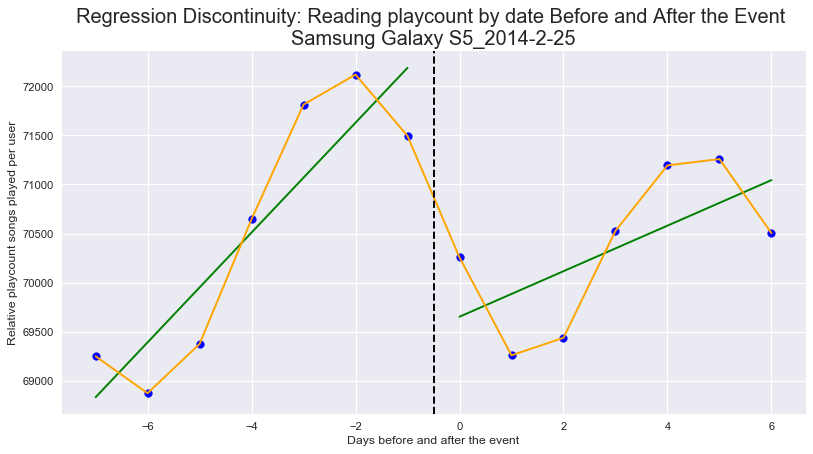


---------------------------------------------------------

R-squared: 0.980509688987

---------------------------------------------------------

Parameters

Intercept                  3402.771429
threshold                  -257.975000
days_to_event                -2.116071
threshold:days_to_event    -238.437500
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.151859e-12
threshold                  3.896450e-02
days_to_event              9.131199e-01
threshold:days_to_event    4.504078e-06
dtype: float64

---------------------------------------------------------



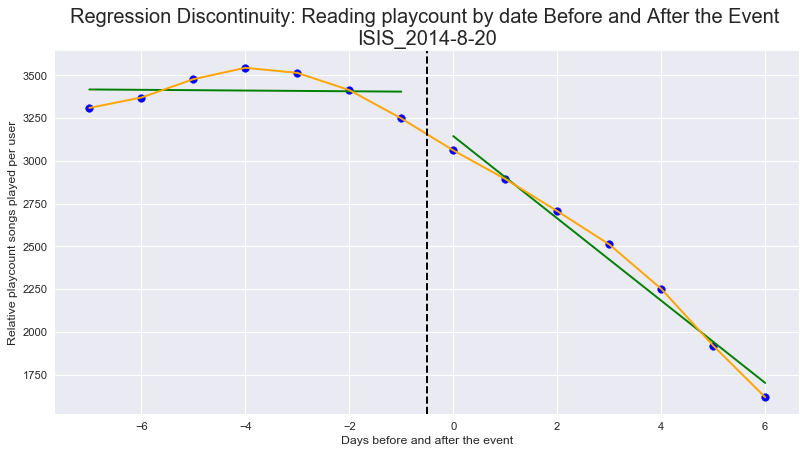


---------------------------------------------------------

R-squared: 0.791933125239

---------------------------------------------------------

Parameters

Intercept                  68003.921429
threshold                   2494.241071
days_to_event               -435.450000
threshold:days_to_event     -367.551786
dtype: float64

---------------------------------------------------------

P-values

Intercept                  1.048436e-15
threshold                  3.318382e-02
days_to_event              3.277980e-02
threshold:days_to_event    1.702880e-01
dtype: float64

---------------------------------------------------------



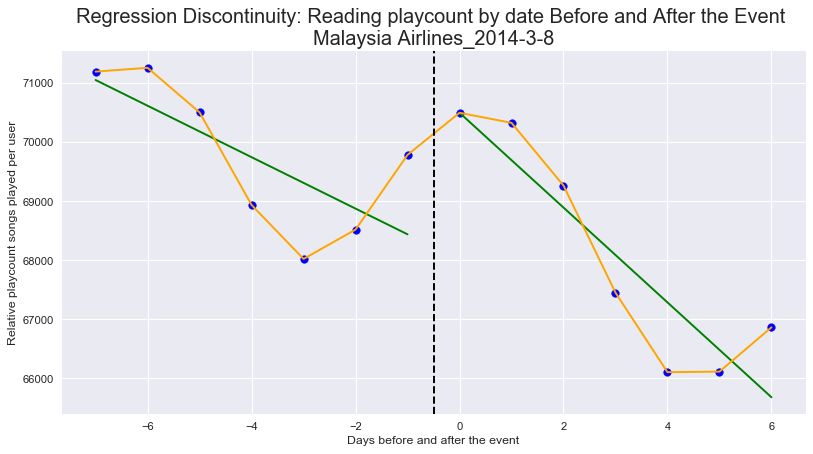


---------------------------------------------------------

R-squared: 0.98661478932

---------------------------------------------------------

Parameters

Intercept                  6489.100000
threshold                   593.614286
days_to_event              -307.655357
threshold:days_to_event     176.576786
dtype: float64

---------------------------------------------------------

P-values

Intercept                  2.372081e-15
threshold                  2.056356e-04
days_to_event              1.111049e-08
threshold:days_to_event    4.429100e-05
dtype: float64

---------------------------------------------------------



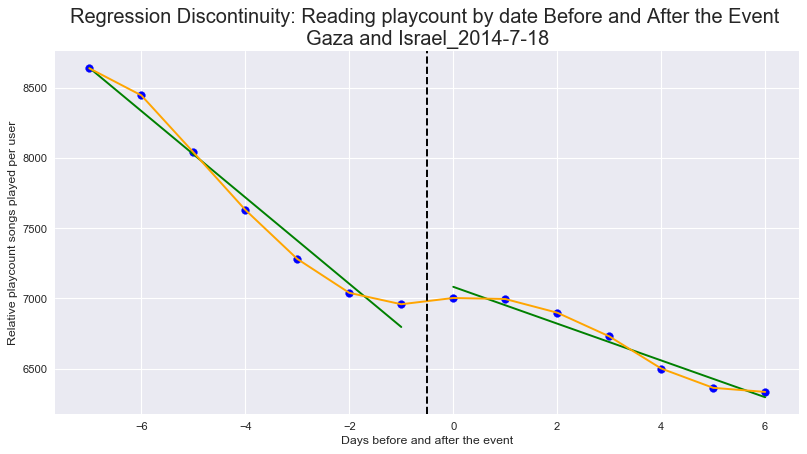


---------------------------------------------------------

R-squared: 0.74650885689

---------------------------------------------------------

Parameters

Intercept                  9064.171429
threshold                   817.964286
days_to_event              -224.132143
threshold:days_to_event     268.189286
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.726026e-13
threshold                  7.106812e-03
days_to_event              3.442921e-04
threshold:days_to_event    1.161103e-03
dtype: float64

---------------------------------------------------------



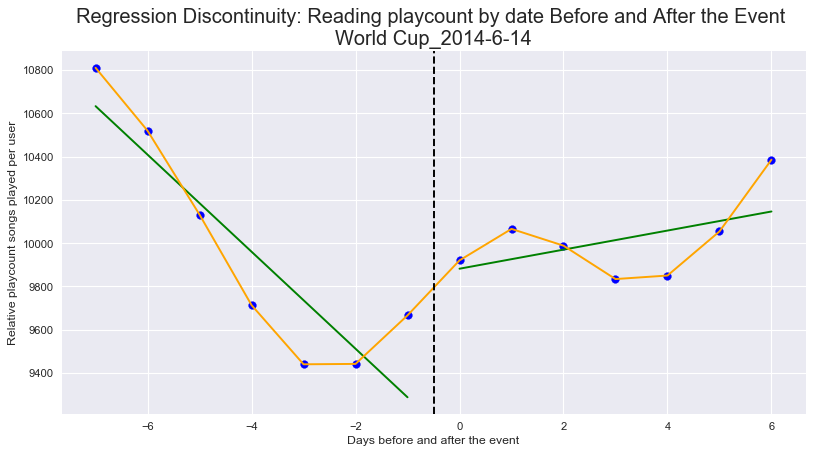


---------------------------------------------------------

R-squared: 0.926730346307

---------------------------------------------------------

Parameters

Intercept                  59163.028571
threshold                   2284.789286
days_to_event              -1038.939286
threshold:days_to_event      294.228571
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.364111e-15
threshold                  4.329943e-02
days_to_event              1.250180e-04
threshold:days_to_event    2.541698e-01
dtype: float64

---------------------------------------------------------



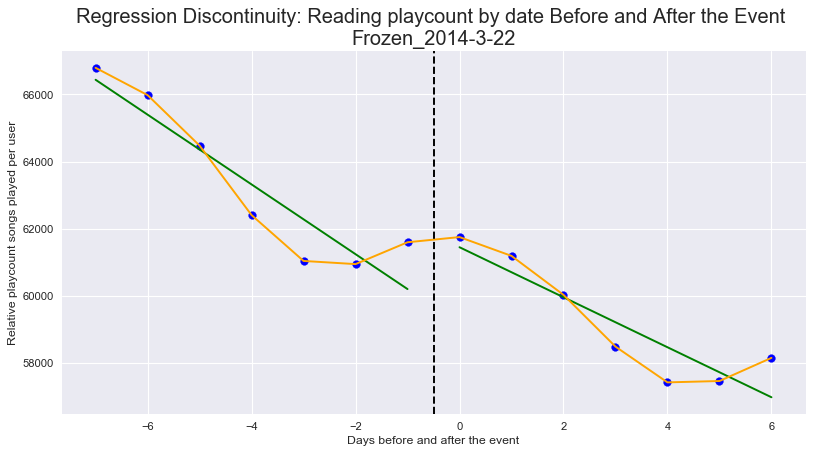


---------------------------------------------------------

R-squared: 0.67061030715

---------------------------------------------------------

Parameters

Intercept                  69664.121429
threshold                   1956.230357
days_to_event               -354.203571
threshold:days_to_event      -88.166071
dtype: float64

---------------------------------------------------------

P-values

Intercept                  8.395177e-17
threshold                  3.524402e-02
days_to_event              2.981583e-02
threshold:days_to_event    6.654543e-01
dtype: float64

---------------------------------------------------------



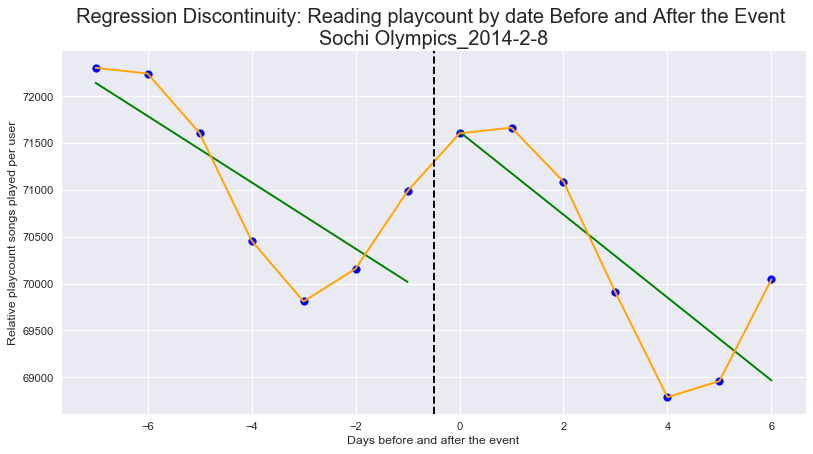


---------------------------------------------------------

R-squared: 0.926730346307

---------------------------------------------------------

Parameters

Intercept                  59163.028571
threshold                   2284.789286
days_to_event              -1038.939286
threshold:days_to_event      294.228571
dtype: float64

---------------------------------------------------------

P-values

Intercept                  3.364111e-15
threshold                  4.329943e-02
days_to_event              1.250180e-04
threshold:days_to_event    2.541698e-01
dtype: float64

---------------------------------------------------------



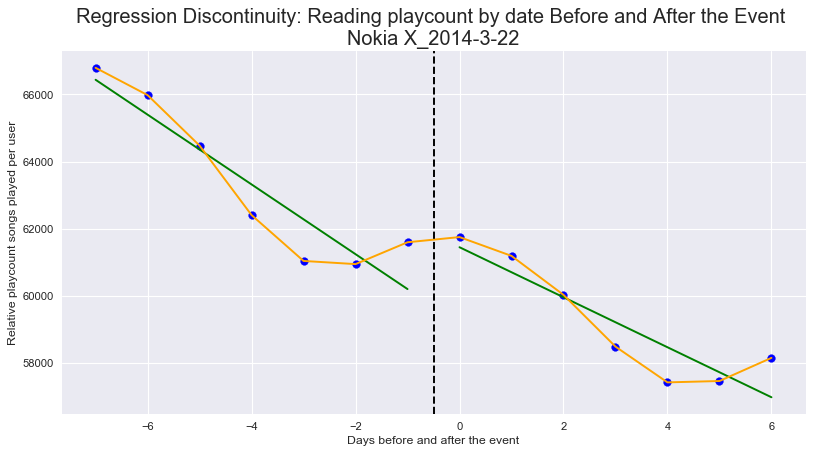

In [30]:
for year in list(set(DF['year'])):
    
    df_focus = DF[(DF.year == year)]

    for index, row in events_filtered.iterrows():
        if row.year == year:
            dateEvent = row.date
            dateBefore = row.date - timedelta(days=N)
            dateAfter = row.date + timedelta(days=N)

            def threshold(size):
                if(size>=dateEvent):
                    return 1
                return 0

            def days_to_event(size):
                delta = size - dateEvent
                return delta.days
            
            def linear_decrease_from_event(size):
                delta = size - dateEvent
                if delta.days < 0:
                    return 0
                else:
                    value = 7 - delta.days
                    return value
            
            def exp_decrease_from_event(size):
                delta = size - dateEvent
                if delta.days < 0:
                    return 0
                else:
                    value = 49 - math.pow(delta.days, 2)
                    return value

            # ONLY FOR X DAYS BEFORE AND AFTER THE EVENT
            data = df_focus[(df_focus.index < dateAfter) & (df_focus.index >= dateBefore)]

            # WHEN THE FILTERING RETURNS AN EMPTY DATAFRAME => CONTINUE
            if len(list(data['trend'])) != 14: 
                continue

            data['threshold'] = data.index.map(threshold)
            data['days_to_event'] = data.index.map(days_to_event)
            data['linear_decrease_after_event'] = data.index.map(linear_decrease_from_event)
            data['exp_decrease_after_event'] = data.index.map(exp_decrease_from_event)
            
            result = sm.ols(formula="trend ~ threshold + days_to_event + threshold * days_to_event", data=data).fit()

            # If sinificant, plot lines
            if result.pvalues['threshold'] <0.05:
                
                #print(result.summary())
                print('')
                print('---------------------------------------------------------')
                print('')
                
                print('R-squared: %s' % result.rsquared)
                
                print('')
                print('---------------------------------------------------------')
                print('')
                print('Parameters')
                print('')
                print(result.params)
                print('')
                print('---------------------------------------------------------')
                print('')
                print('P-values')
                print('')
                print(result.pvalues)
                print('')
                print('---------------------------------------------------------')
                print('')
                 
                plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
                plt.scatter(data.days_to_event,data.trend, color="blue")
                plt.plot(data.days_to_event[:7], result.predict()[:7], '-', color='green')
                plt.plot(data.days_to_event[7:], result.predict()[7:], '-', color='green')
                plt.plot(data.days_to_event, data.trend, '-', color='orange')
                plt.axvline(x=-0.5,color="black", linestyle="--")
                plt.xlabel('Days before and after the event')
                plt.ylabel('Relative playcount songs played per user')
                plt.title("Regression Discontinuity: Reading playcount by date Before and After the Event \n" + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day), fontsize="18")
                #plt.savefig('../data/figures/RDD_' + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day) + '.png', dpi=300)
                #plt.close()
                plt.show()



There are some events for which a continuous line is noticable, but that are marked as discontinuous because of an effect at day 5, 6 or 7. Therefore we decide to perform a same analysis, but only consider the three days before and after the event instead of 7. That is, we try to predict the trend line.

/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/eelcowiechert/anacona36/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu


---------------------------------------------------------

R-squared: 0.996976671048

---------------------------------------------------------

Parameters

Intercept                  3.239351
threshold                  0.247930
days_to_event             -0.092377
threshold:days_to_event    0.254673
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000049
threshold                  0.011213
days_to_event              0.012724
threshold:days_to_event    0.003396
dtype: float64

---------------------------------------------------------



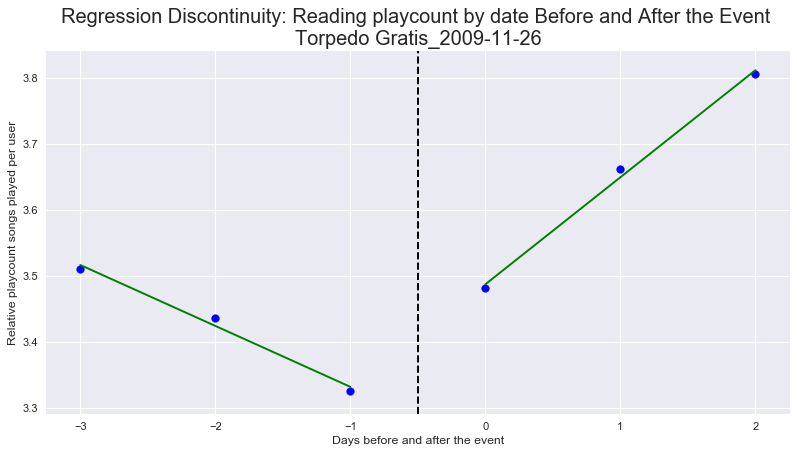


---------------------------------------------------------

R-squared: 0.97328328129

---------------------------------------------------------

Parameters

Intercept                  3.540604
threshold                 -0.405170
days_to_event              0.123095
threshold:days_to_event   -0.162220
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000236
threshold                  0.023560
days_to_event              0.039326
threshold:days_to_event    0.044892
dtype: float64

---------------------------------------------------------



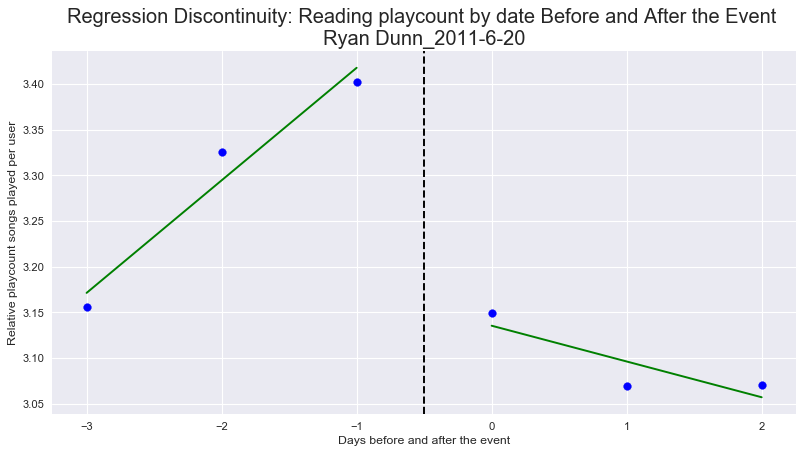


---------------------------------------------------------

R-squared: 0.956060275217

---------------------------------------------------------

Parameters

Intercept                  2.929970
threshold                 -0.507608
days_to_event              0.180864
threshold:days_to_event   -0.230058
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000794
threshold                  0.034133
days_to_event              0.041936
threshold:days_to_event    0.051090
dtype: float64

---------------------------------------------------------



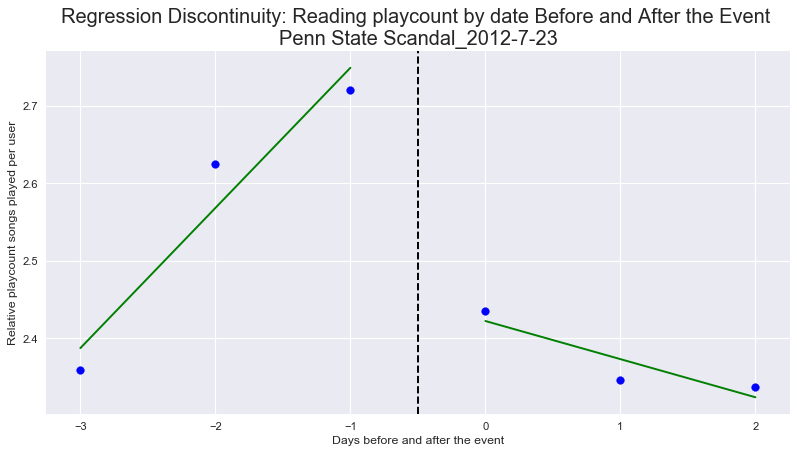


---------------------------------------------------------

R-squared: 0.966956190403

---------------------------------------------------------

Parameters

Intercept                  2.697614
threshold                 -0.419744
days_to_event              0.139449
threshold:days_to_event   -0.220683
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000690
threshold                  0.036604
days_to_event              0.051173
threshold:days_to_event    0.041497
dtype: float64

---------------------------------------------------------



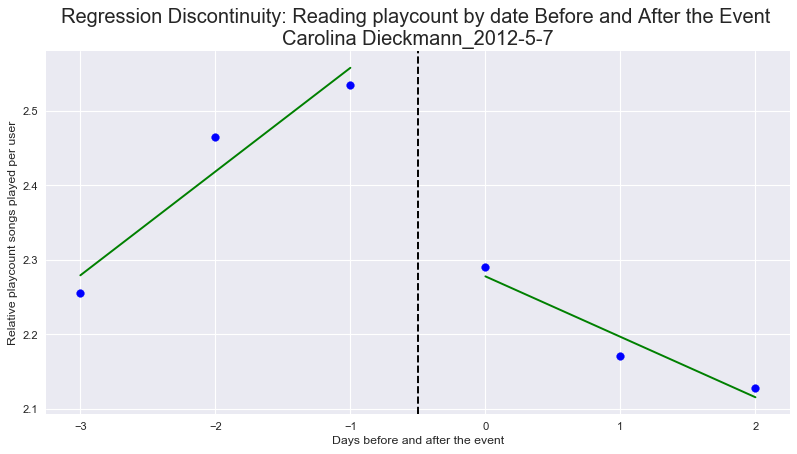


---------------------------------------------------------

R-squared: 0.965643700992

---------------------------------------------------------

Parameters

Intercept                  3.238456
threshold                 -0.399281
days_to_event              0.154450
threshold:days_to_event   -0.190099
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000293
threshold                  0.025190
days_to_event              0.026527
threshold:days_to_event    0.034585
dtype: float64

---------------------------------------------------------



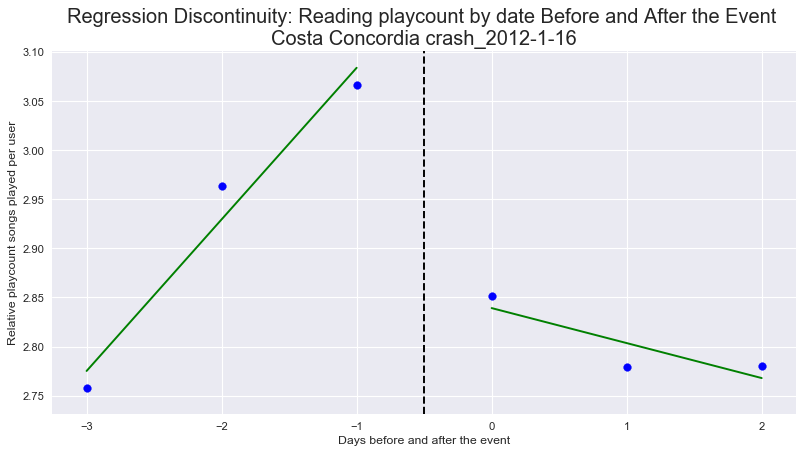


---------------------------------------------------------

R-squared: 0.944838336105

---------------------------------------------------------

Parameters

Intercept                  3.188511
threshold                 -0.483696
days_to_event              0.154633
threshold:days_to_event   -0.213685
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000914
threshold                  0.049950
days_to_event              0.074203
threshold:days_to_event    0.077318
dtype: float64

---------------------------------------------------------



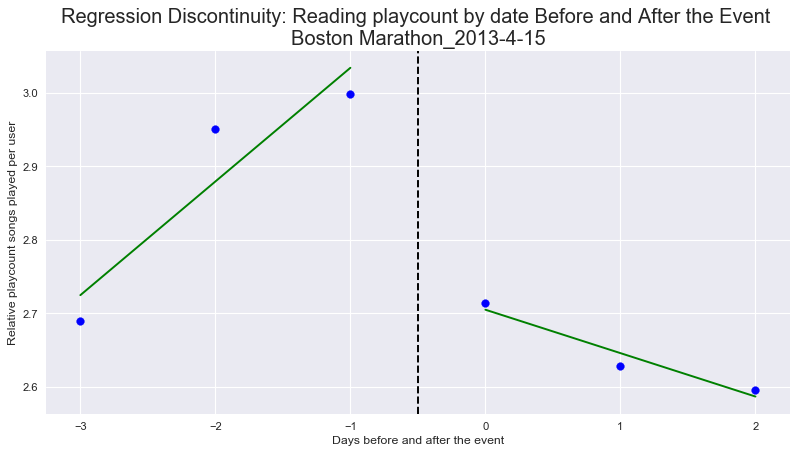


---------------------------------------------------------

R-squared: 0.95372997736

---------------------------------------------------------

Parameters

Intercept                  3.605687
threshold                 -0.598439
days_to_event              0.200971
threshold:days_to_event   -0.274644
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000874
threshold                  0.040534
days_to_event              0.055422
threshold:days_to_event    0.059012
dtype: float64

---------------------------------------------------------



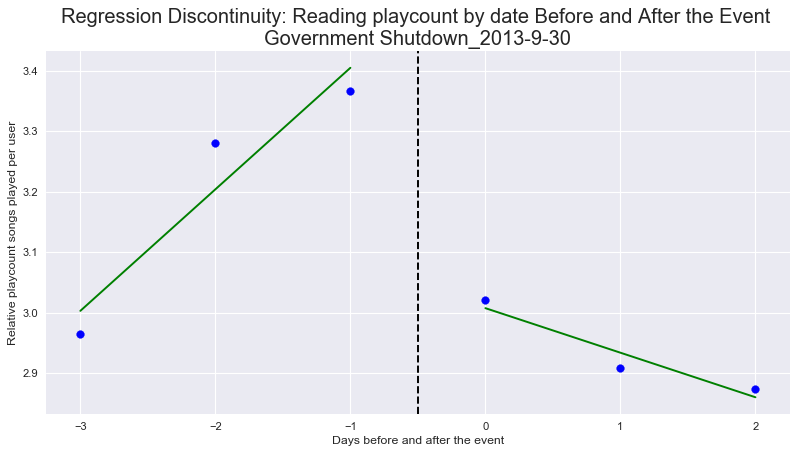


---------------------------------------------------------

R-squared: 0.956226453554

---------------------------------------------------------

Parameters

Intercept                  3.552553
threshold                 -0.601111
days_to_event              0.212190
threshold:days_to_event   -0.278582
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000793
threshold                  0.035619
days_to_event              0.044508
threshold:days_to_event    0.051105
dtype: float64

---------------------------------------------------------



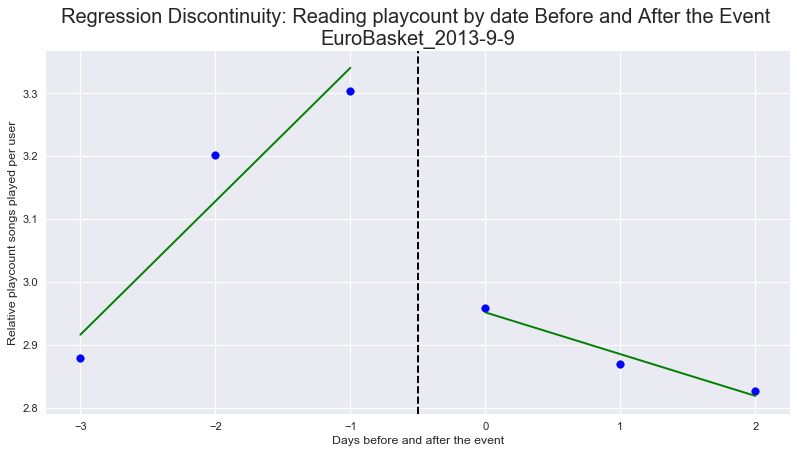


---------------------------------------------------------

R-squared: 0.954370984685

---------------------------------------------------------

Parameters

Intercept                  3.565208
threshold                 -0.619739
days_to_event              0.193065
threshold:days_to_event   -0.299564
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.001186
threshold                  0.049438
days_to_event              0.076933
threshold:days_to_event    0.065153
dtype: float64

---------------------------------------------------------



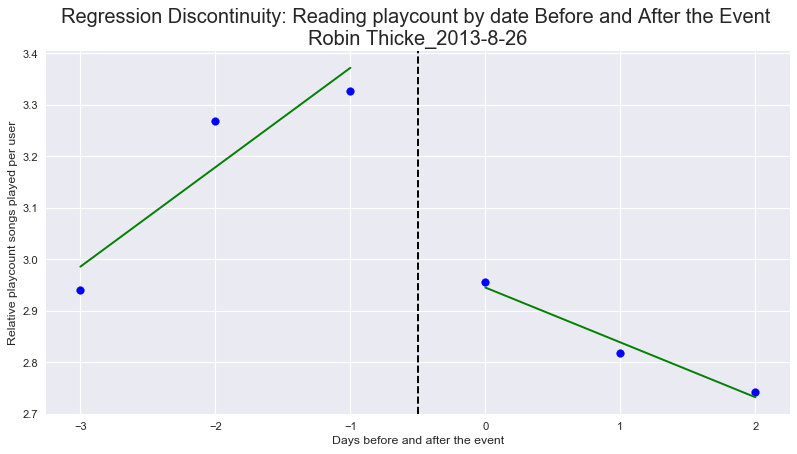


---------------------------------------------------------

R-squared: 0.954370984685

---------------------------------------------------------

Parameters

Intercept                  3.565208
threshold                 -0.619739
days_to_event              0.193065
threshold:days_to_event   -0.299564
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.001186
threshold                  0.049438
days_to_event              0.076933
threshold:days_to_event    0.065153
dtype: float64

---------------------------------------------------------



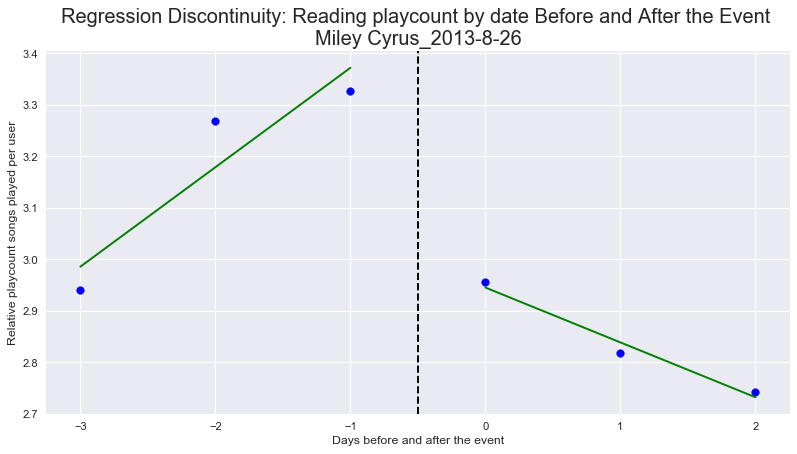


---------------------------------------------------------

R-squared: 0.942529112348

---------------------------------------------------------

Parameters

Intercept                  3.158776
threshold                 -0.456839
days_to_event              0.154239
threshold:days_to_event   -0.208737
dtype: float64

---------------------------------------------------------

P-values

Intercept                  0.000821
threshold                  0.049396
days_to_event              0.066560
threshold:days_to_event    0.072036
dtype: float64

---------------------------------------------------------



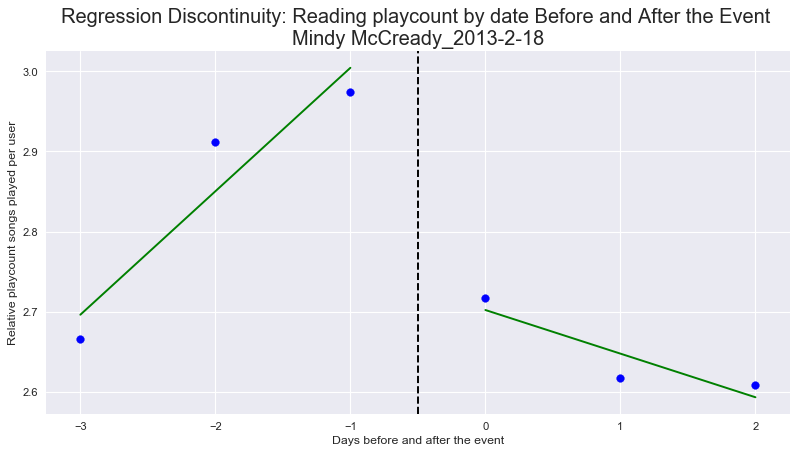

In [36]:
N = 3

for year in list(set(DF['year'])):
    
    df_focus = DF[(DF.year == year)]

    for index, row in events_filtered.iterrows():
        if row.year == year:
            dateEvent = row.date
            dateBefore = row.date - timedelta(days=N)
            dateAfter = row.date + timedelta(days=N)

            def threshold(size):
                if(size>=dateEvent):
                    return 1
                return 0

            def days_to_event(size):
                delta = size - dateEvent
                return delta.days
            
            def linear_decrease_from_event(size):
                delta = size - dateEvent
                if delta.days < 0:
                    return 0
                else:
                    value = 3 - delta.days
                    return value
            
            def exp_decrease_from_event(size):
                delta = size - dateEvent
                if delta.days < 0:
                    return 0
                else:
                    value = 9 - math.pow(delta.days, 2)
                    return value

            # ONLY FOR X DAYS BEFORE AND AFTER THE EVENT
            data = df_focus[(df_focus.index < dateAfter) & (df_focus.index >= dateBefore)]

            # WHEN THE FILTERING RETURNS AN EMPTY DATAFRAME => CONTINUE
            if len(list(data['trend'])) != 6: 
                continue

            data['threshold'] = data.index.map(threshold)
            data['days_to_event'] = data.index.map(days_to_event)
            data['linear_decrease_after_event'] = data.index.map(linear_decrease_from_event)
            data['exp_decrease_after_event'] = data.index.map(exp_decrease_from_event)
            
            result = sm.ols(formula="rel_trend ~ threshold + days_to_event + threshold * days_to_event", data=data).fit()

            # If sinificant, plot lines
            if result.pvalues['threshold'] <0.05:
                
                #print(result.summary())
                print('')
                print('---------------------------------------------------------')
                print('')
                
                print('R-squared: %s' % result.rsquared)
                
                print('')
                print('---------------------------------------------------------')
                print('')
                print('Parameters')
                print('')
                print(result.params)
                print('')
                print('---------------------------------------------------------')
                print('')
                print('P-values')
                print('')
                print(result.pvalues)
                print('')
                print('---------------------------------------------------------')
                print('')
                 
                try:
                    plt.figure(num=None, figsize=(12, 6), dpi=80, facecolor='w', edgecolor='k')
                    plt.scatter(data.days_to_event,data.rel_trend, color="blue")
                    plt.plot(data.days_to_event[:3], result.predict()[:3], '-', color='green')
                    plt.plot(data.days_to_event[3:], result.predict()[3:], '-', color='green')
                    plt.axvline(x=-0.5,color="black", linestyle="--")
                    plt.xlabel('Days before and after the event')
                    plt.ylabel('Relative playcount songs played per user')
                    plt.title("Regression Discontinuity: Reading playcount by date Before and After the Event \n" + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day), fontsize="18")
                    #plt.savefig('../data/figures/RDD_' + str(row.description) + '_' + str(row.year) + '-'+ str(row.month) + '-'+ str(row.day) + '.png', dpi=300)
                    #plt.close()
                    plt.show()
                except:
                    continue

